Restarted .venv (Python 3.10.7)

No kernel connected

Connected to .venv (Python 3.10.7)

In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

2024-11-05 17:35:01.512674: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-05 17:35:01.529574: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-05 17:35:01.550979: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-05 17:35:01.557523: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-05 17:35:01.574191: I tensorflow/core/platform/cpu_feature_guar

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# Define the function to map (hour, minute) tuples to float values upto 
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
                                                  weight_decay=1e-5), 
                  loss='huber', metrics=['mae'])

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2024-11-05 17:35:08.524292: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22461 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:3b:00.0, compute capability: 8.6
2024-11-05 17:35:08.525342: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22461 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:af:00.0, compute capability: 8.6


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 18, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 20736)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    10,617,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,072,897 (42.24 MB)

 Trainable params: 11,071,937 (42.24 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)



history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500


I0000 00:00:1730846114.275800   31774 service.cc:146] XLA service 0x7f82a8014f70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730846114.275843   31774 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1730846114.275848   31774 service.cc:154]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-11-05 17:35:14.407159: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-05 17:35:14.781053: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907


 10/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 14.2360 - mae: 14.7122

I0000 00:00:1730846121.474601   31774 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


223/225 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 4.5493 - mae: 5.0225

2024-11-05 17:35:29.462278: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_151', 8 bytes spill stores, 8 bytes spill loads



225/225 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step - loss: 4.5320 - mae: 5.0051 - val_loss: 3.8809 - val_mae: 4.3522 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 2.4237 - mae: 2.8870 - val_loss: 3.4391 - val_mae: 3.9081 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 2.1101 - mae: 2.5657 - val_loss: 3.3986 - val_mae: 3.8714 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 1.8907 - mae: 2.3433 - val_loss: 3.2965 - val_mae: 3.7714 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 1.6420 - mae: 2.0819 - val_loss: 3.1475 - val_mae: 3.6196 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 1.4903 - mae: 1.9260 - val_loss: 3.0325 - val_mae: 3.5004 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 1.3418 - mae: 1.7693 - val_loss: 2.9907 - val_mae: 3.4636 - learning_rate: 0.0010
Epo

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

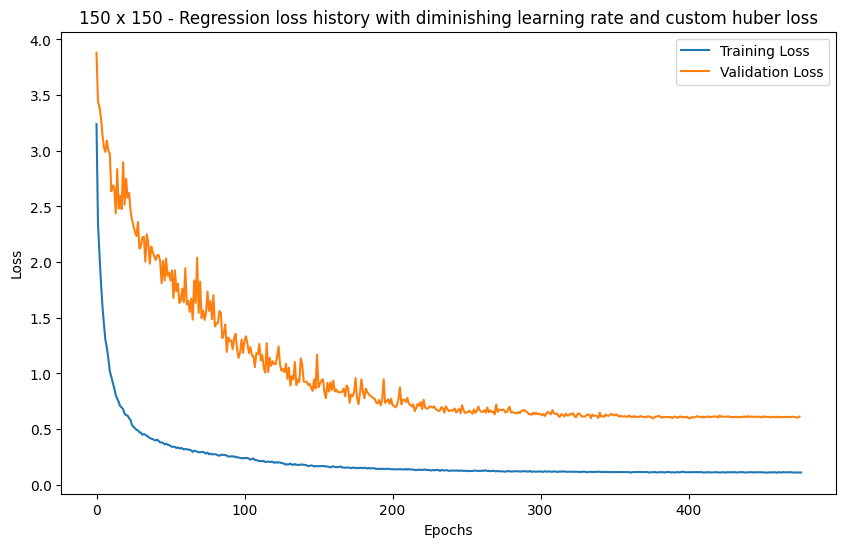

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.8868977936149174

Text(0.5, 1.0, 'Regression with diminishing learning rate with custom huber loss')

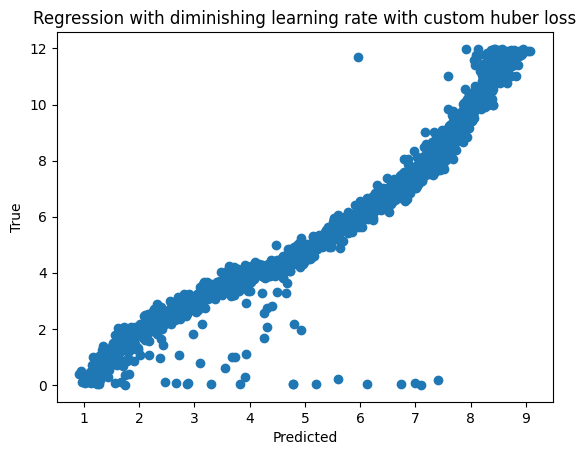

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Regression with diminishing learning rate with custom huber loss')

In [ ]:
# y_true = np.array([0.1,1.2,2.3,3.4,4.5,5.6,6.7,7.8,8.9,10.11,11.22])
# y_pred = np.array([-0.1,-1.2,2.3,3.4,4.5,5.6,6.7,-7.8,12.9,10.11,-11.22])

# reg_loss_funtion(y_true, y_pred)

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

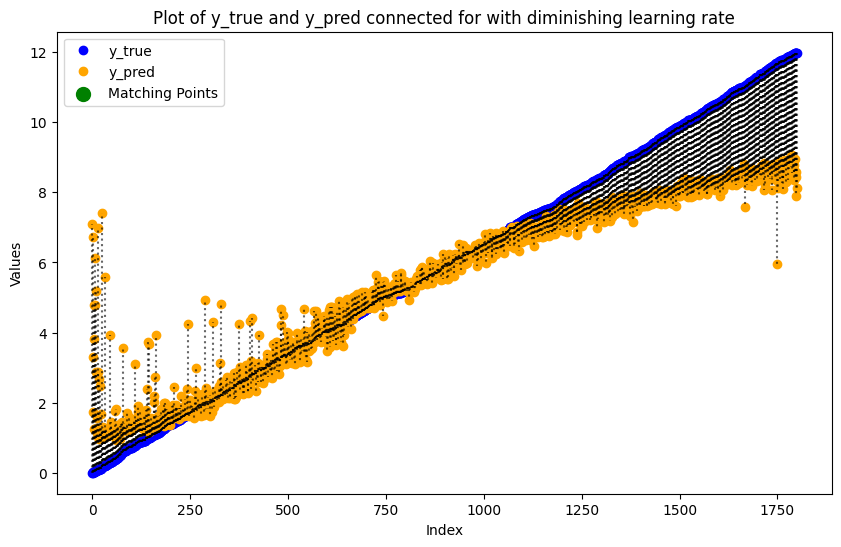

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

# Adding labels and legend
plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Plot of y_true and y_pred connected for with diminishing learning rate')
plt.legend()

# Show the plot
plt.show()

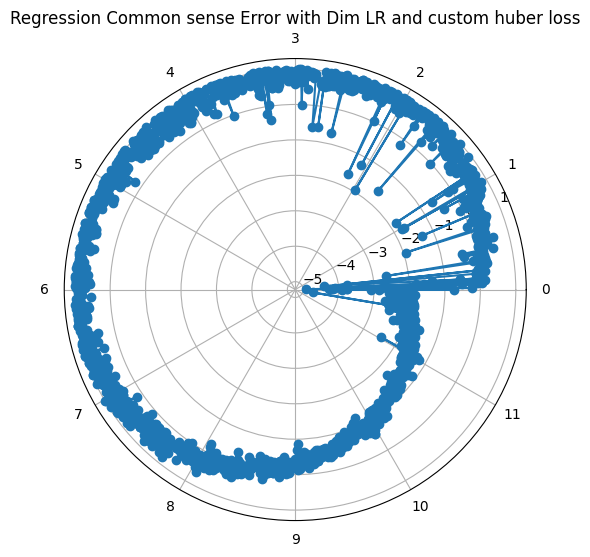

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = 1 - common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title("Regression Common sense Error with Dim LR and custom huber loss")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
# labels = np.array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])
# # values = np.array([.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5])  # Random values for each hour
# values = np.arange(12)
# vals = np.ones_like(values)
# # Angles for each bar
# angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
# print(values)
# # Plotting
# fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
# bars = ax.bar(values/12.0*2*np.pi , vals, color=plt.cm.viridis(values), alpha=0.7)

# # Label each bar with hour labels
# ax.set_xticks(angles)
# ax.set_xticklabels(labels)

# plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

0.596607506275177

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.11258578300476074

In [ ]:
history.history['mae'][min_val_loss_index]

0.35769736766815186

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.9263855814933777

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.596607506275177
Loss at this : 0.11258578300476074
MAE : 0.35769736766815186
MAE Val : 0.9263855814933777
Common Sense MAE Train : 0.8572086957932313
Common Sense MAE Val : 0.926143283372879
Common Sense MAE Test : 0.8868977936149174


In [ ]:
images.shape

(18000, 150, 150)

In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images.npy")
labels = np.load("A1/data/labels.npy")

In [ ]:
# Define the function to map (hour, minute) tuples to float values upto 
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 75, 75, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
                                                  weight_decay=1e-5), 
                  loss='huber', metrics=['mae'])

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 75, 75, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 18, 18, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 18, 18, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │     2,097,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,553,217 (9.74 MB)

 Trainable params: 2,552,257 (9.74 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)



history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 12s 16ms/step - loss: 3.0579 - mae: 3.5270 - val_loss: 2.9423 - val_mae: 3.4157 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.2310 - mae: 2.6915 - val_loss: 3.0542 - val_mae: 3.5283 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.9373 - mae: 2.3901 - val_loss: 3.2298 - val_mae: 3.7028 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6351 - mae: 2.0774 - val_loss: 2.5321 - val_mae: 3.0043 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.4141 - mae: 1.8478 - val_loss: 2.2863 - val_mae: 2.7572 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.2397 - mae: 1.6619 - val_loss: 2.4925 - val_mae: 2.9642 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0993 - mae: 1.5175 - val_loss: 1.9982 - val_mae: 2.4694 - learning_rate: 0.00

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

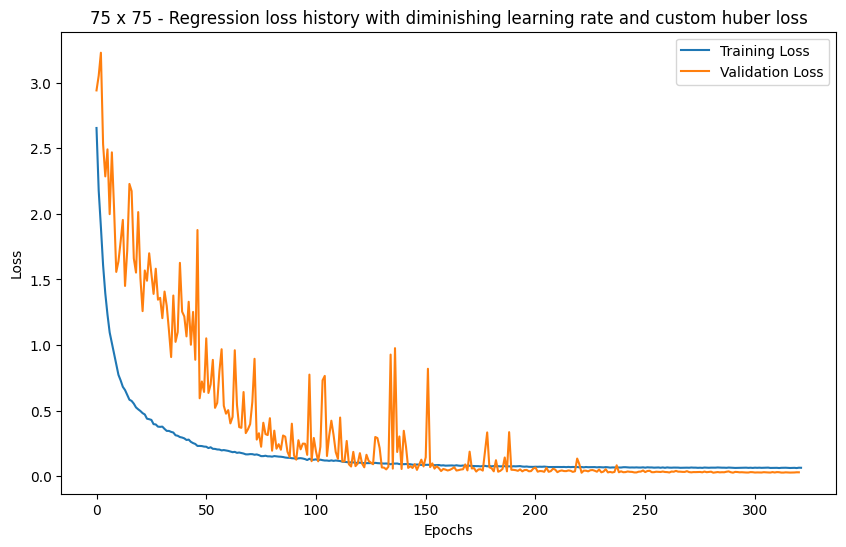

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.161132986158371

Text(0.5, 1.0, 'Regression with diminishing learning rate with custom huber loss')

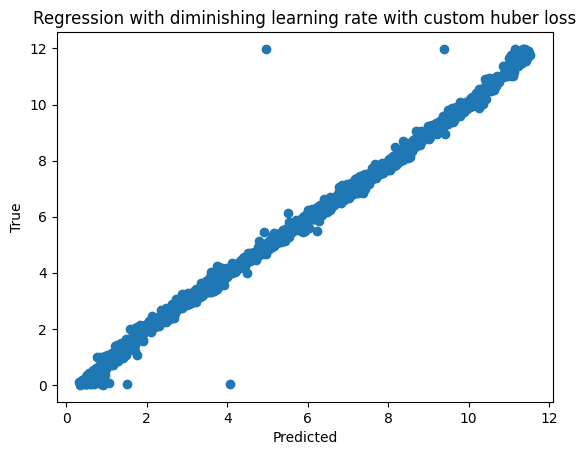

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Regression with diminishing learning rate with custom huber loss')

In [ ]:
# y_true = np.array([0.1,1.2,2.3,3.4,4.5,5.6,6.7,7.8,8.9,10.11,11.22])
# y_pred = np.array([-0.1,-1.2,2.3,3.4,4.5,5.6,6.7,-7.8,12.9,10.11,-11.22])

# reg_loss_funtion(y_true, y_pred)

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

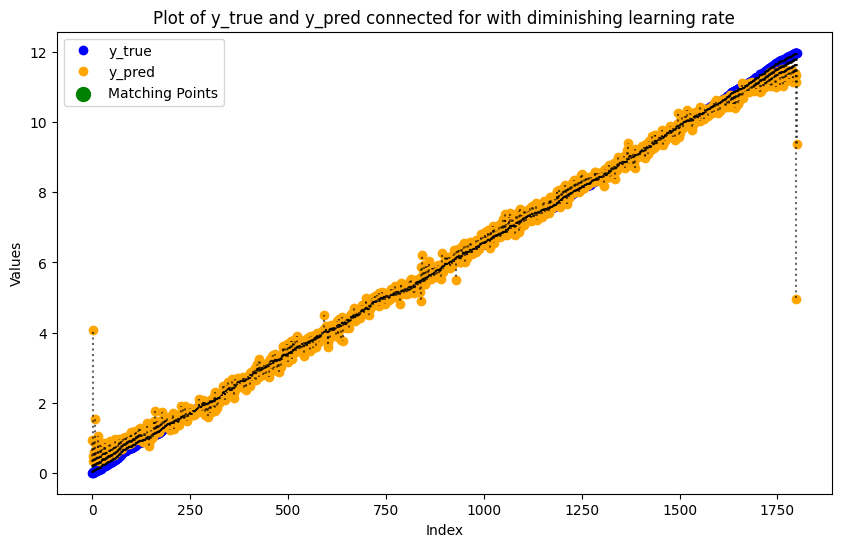

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

# Adding labels and legend
plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Plot of y_true and y_pred connected for with diminishing learning rate')
plt.legend()

# Show the plot
plt.show()

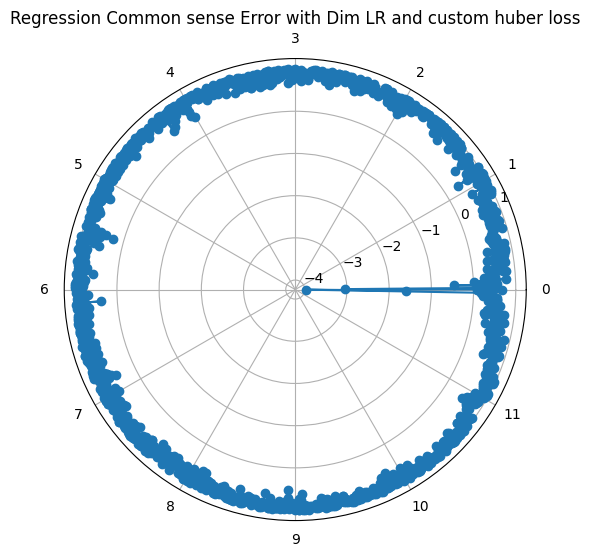

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = 1 - common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title("Regression Common sense Error with Dim LR and custom huber loss")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
# labels = np.array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])
# # values = np.array([.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5])  # Random values for each hour
# values = np.arange(12)
# vals = np.ones_like(values)
# # Angles for each bar
# angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
# print(values)
# # Plotting
# fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
# bars = ax.bar(values/12.0*2*np.pi , vals, color=plt.cm.viridis(values), alpha=0.7)

# # Label each bar with hour labels
# ax.set_xticks(angles)
# ax.set_xticklabels(labels)

# plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

0.0257007647305727

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.06938883662223816

In [ ]:
history.history['mae'][min_val_loss_index]

0.28223127126693726

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.1582232117652893

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.0257007647305727
Loss at this : 0.06938883662223816
MAE : 0.28223127126693726
MAE Val : 0.1582232117652893
Common Sense MAE Train : 0.13568444648098946
Common Sense MAE Val : 0.1582229122036828
Common Sense MAE Test : 0.161132986158371


In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images.npy")
labels = np.load("A1/data/labels.npy")

In [ ]:
# Define the function to map (hour, minute) tuples to float values upto 
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 75, 75, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    
    model.add(keras.layers.Dense(64, activation="relu"))
    model.add(keras.layers.Dropout(0.1))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
                                                  weight_decay=1e-5), 
                  loss='huber', metrics=['mae'])

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)               │ (None, 75, 75, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 18, 18, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 18, 18, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │     2,097,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │            6

 Total params: 2,561,409 (9.77 MB)

 Trainable params: 2,560,449 (9.77 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)



history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 3.0073 - mae: 3.4784 - val_loss: 4.1394 - val_mae: 4.6122 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 2.2073 - mae: 2.6671 - val_loss: 3.3257 - val_mae: 3.7967 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.9380 - mae: 2.3898 - val_loss: 3.1079 - val_mae: 3.5798 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.5746 - mae: 2.0144 - val_loss: 2.7236 - val_mae: 3.1959 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3181 - mae: 1.7438 - val_loss: 2.5248 - val_mae: 2.9905 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1500 - mae: 1.5680 - val_loss: 2.3108 - val_mae: 2.7770 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.9976 - mae: 1.4057 - val_loss: 2.8039 - val_mae: 3.2754 - learning_rate: 0.00

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

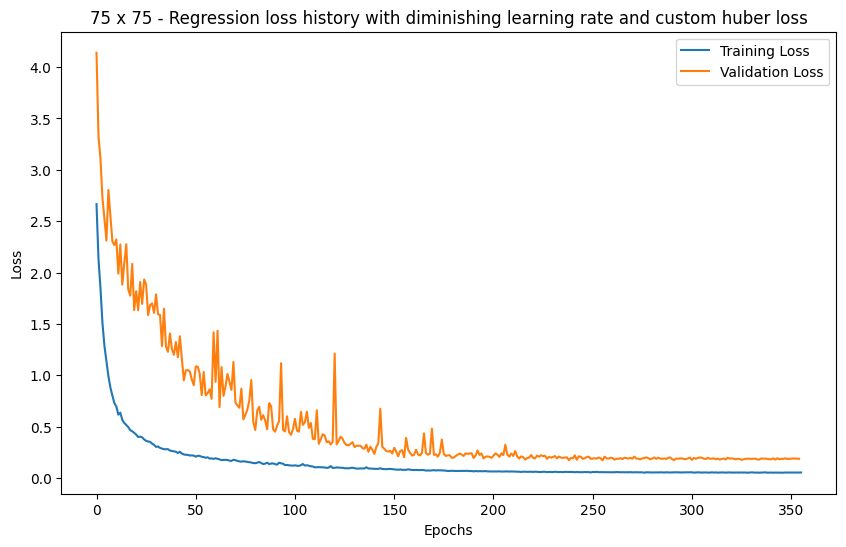

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.4211511322939131

Text(0.5, 1.0, 'Regression with diminishing learning rate with custom huber loss')

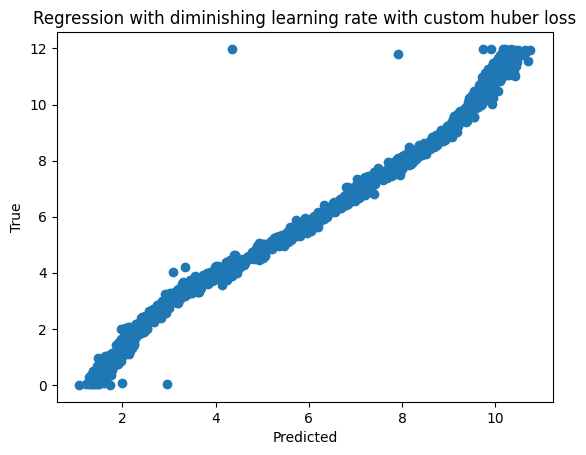

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Regression with diminishing learning rate with custom huber loss')

In [ ]:
# y_true = np.array([0.1,1.2,2.3,3.4,4.5,5.6,6.7,7.8,8.9,10.11,11.22])
# y_pred = np.array([-0.1,-1.2,2.3,3.4,4.5,5.6,6.7,-7.8,12.9,10.11,-11.22])

# reg_loss_funtion(y_true, y_pred)

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

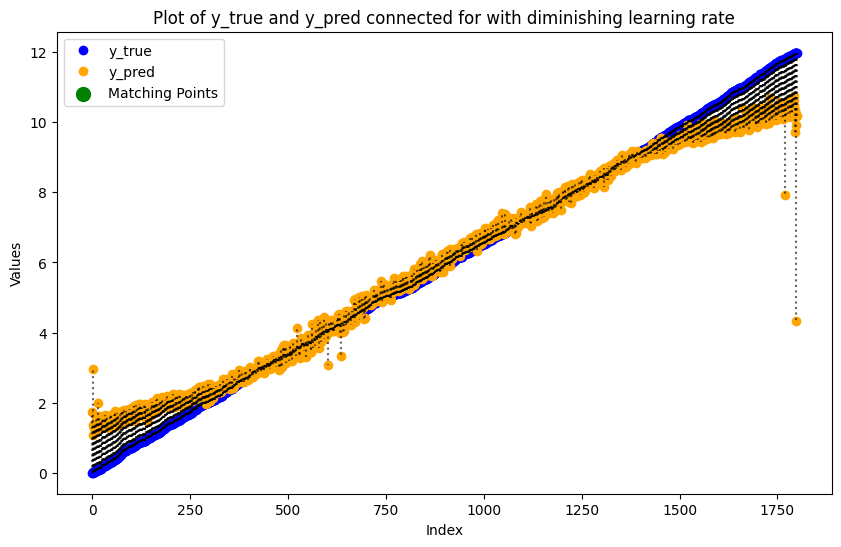

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

# Adding labels and legend
plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Plot of y_true and y_pred connected for with diminishing learning rate')
plt.legend()

# Show the plot
plt.show()

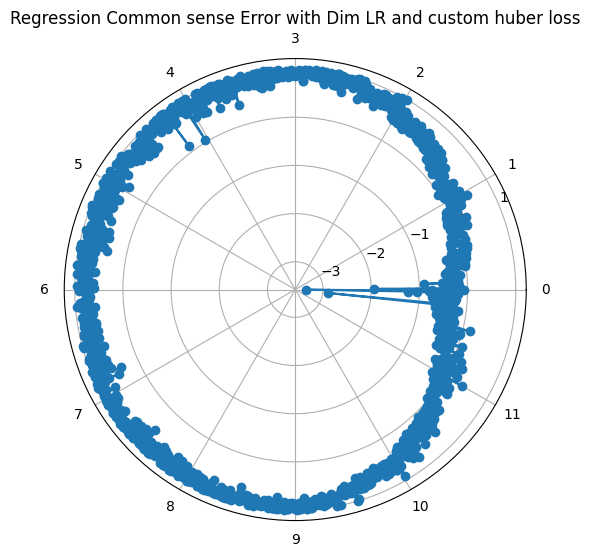

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = 1 - common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title("Regression Common sense Error with Dim LR and custom huber loss")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
# labels = np.array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])
# # values = np.array([.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5])  # Random values for each hour
# values = np.arange(12)
# vals = np.ones_like(values)
# # Angles for each bar
# angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
# print(values)
# # Plotting
# fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
# bars = ax.bar(values/12.0*2*np.pi , vals, color=plt.cm.viridis(values), alpha=0.7)

# # Label each bar with hour labels
# ax.set_xticks(angles)
# ax.set_xticklabels(labels)

# plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

0.17363935708999634

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.05788514390587807

In [ ]:
history.history['mae'][min_val_loss_index]

0.2574869394302368

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.42631667852401733

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.17363935708999634
Loss at this : 0.05788514390587807
MAE : 0.2574869394302368
MAE Val : 0.42631667852401733
Common Sense MAE Train : 0.41875252386752765
Common Sense MAE Val : 0.426316134730445
Common Sense MAE Test : 0.4211511322939131


In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# Define the function to map (hour, minute) tuples to float values upto 
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    
    model.add(keras.layers.Dense(64, activation="relu"))
    model.add(keras.layers.Dropout(0.1))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
                                                  weight_decay=1e-5), 
                  loss='huber', metrics=['mae'])

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 18, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 20736)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 512)            │    10,617,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            6

 Total params: 11,081,089 (42.27 MB)

 Trainable params: 11,080,129 (42.27 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)



history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 3.8606 - mae: 4.3356 - val_loss: 3.2964 - val_mae: 3.7664 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 2.4672 - mae: 2.9307 - val_loss: 3.2021 - val_mae: 3.6714 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 2.1960 - mae: 2.6548 - val_loss: 3.1966 - val_mae: 3.6695 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 1.9398 - mae: 2.3930 - val_loss: 3.2899 - val_mae: 3.7636 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 1.7375 - mae: 2.1830 - val_loss: 2.9367 - val_mae: 3.4104 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 1.5314 - mae: 1.9659 - val_loss: 2.8419 - val_mae: 3.3088 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 1.4254 - mae: 1.8554 - val_loss: 3.0005 - val_mae: 3.4677 - learning_rate

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

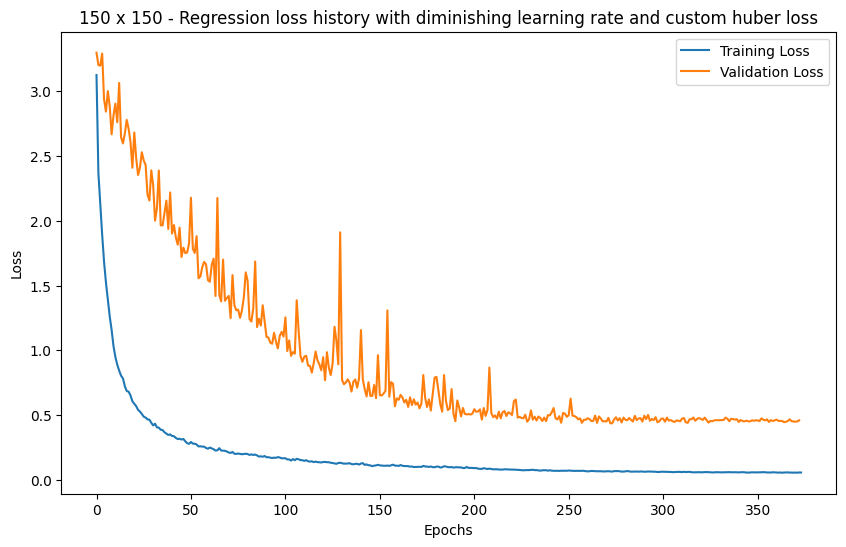

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.718451417315801

Text(0.5, 1.0, 'Regression with diminishing learning rate with custom huber loss')

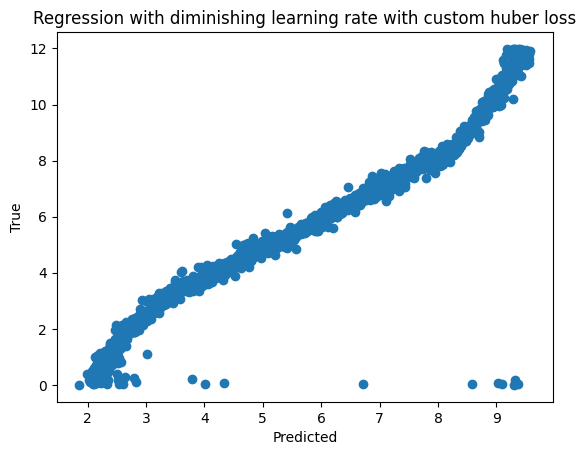

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Regression with diminishing learning rate with custom huber loss')

In [ ]:
# y_true = np.array([0.1,1.2,2.3,3.4,4.5,5.6,6.7,7.8,8.9,10.11,11.22])
# y_pred = np.array([-0.1,-1.2,2.3,3.4,4.5,5.6,6.7,-7.8,12.9,10.11,-11.22])

# reg_loss_funtion(y_true, y_pred)

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

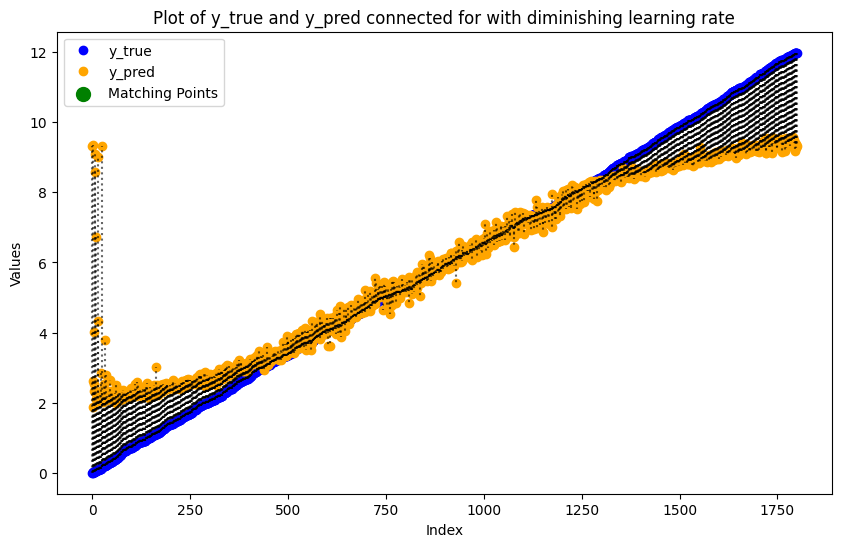

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

# Adding labels and legend
plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Plot of y_true and y_pred connected for with diminishing learning rate')
plt.legend()

# Show the plot
plt.show()

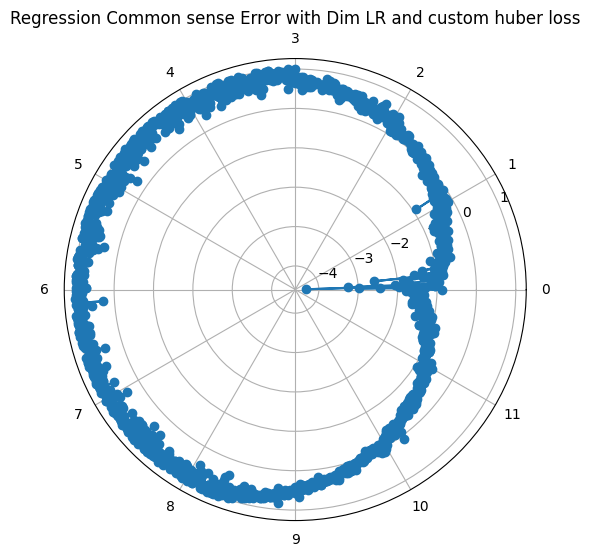

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = 1 - common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title("Regression Common sense Error with Dim LR and custom huber loss")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
# labels = np.array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])
# # values = np.array([.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5])  # Random values for each hour
# values = np.arange(12)
# vals = np.ones_like(values)
# # Angles for each bar
# angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
# print(values)
# # Plotting
# fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
# bars = ax.bar(values/12.0*2*np.pi , vals, color=plt.cm.viridis(values), alpha=0.7)

# # Label each bar with hour labels
# ax.set_xticks(angles)
# ax.set_xticklabels(labels)

# plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

0.43643149733543396

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.06409556418657303

In [ ]:
history.history['mae'][min_val_loss_index]

0.27086666226387024

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.7559607028961182

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.43643149733543396
Loss at this : 0.06409556418657303
MAE : 0.27086666226387024
MAE Val : 0.7559607028961182
Common Sense MAE Train : 0.7243092682460149
Common Sense MAE Val : 0.7499050166072845
Common Sense MAE Test : 0.718451417315801


In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images.npy")
labels = np.load("A1/data/labels.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 75, 75, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(256, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    
    model.add(keras.layers.Dense(128, activation="relu"))
    model.add(keras.layers.Dropout(0.1))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
                                                  weight_decay=1e-5), 
                  loss='huber', metrics=['mae'])

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_16 (Conv2D)              │ (None, 75, 75, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 18, 18, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 18, 18, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 512)            │     2,097,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 1)              │           12

 Total params: 2,651,777 (10.12 MB)

 Trainable params: 2,650,817 (10.11 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)



history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
224/225 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.9270 - mae: 3.3997

2024-11-05 19:42:18.005710: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_153', 8 bytes spill stores, 8 bytes spill loads



225/225 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step - loss: 2.9246 - mae: 3.3972 - val_loss: 3.5708 - val_mae: 4.0399 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 2.1772 - mae: 2.6351 - val_loss: 3.7739 - val_mae: 4.2465 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.8567 - mae: 2.3080 - val_loss: 3.2592 - val_mae: 3.7320 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.5665 - mae: 2.0037 - val_loss: 2.5392 - val_mae: 3.0086 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3087 - mae: 1.7354 - val_loss: 2.8005 - val_mae: 3.2760 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.1041 - mae: 1.5185 - val_loss: 2.5161 - val_mae: 2.9943 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.9541 - mae: 1.3608 - val_loss: 2.7072 - val_mae: 3.1808 - learning_rate: 0.0010
Epoch 8/5

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

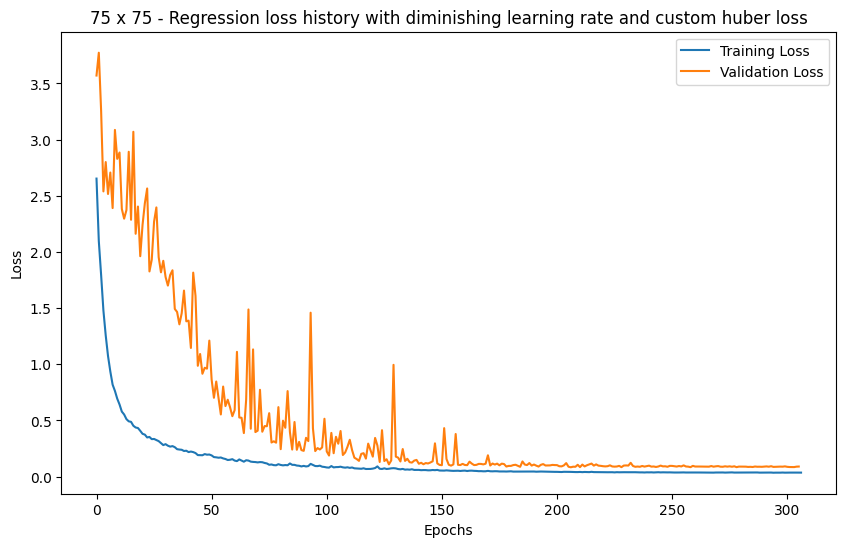

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.30225151231627995

Text(0.5, 1.0, 'Regression with diminishing learning rate with custom huber loss')

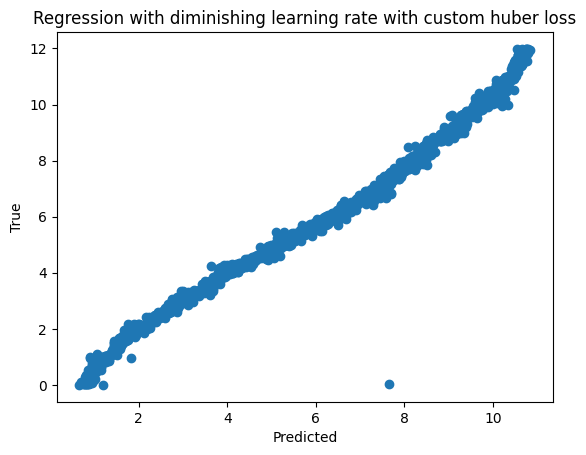

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Regression with diminishing learning rate with custom huber loss')

In [ ]:
# y_true = np.array([0.1,1.2,2.3,3.4,4.5,5.6,6.7,7.8,8.9,10.11,11.22])
# y_pred = np.array([-0.1,-1.2,2.3,3.4,4.5,5.6,6.7,-7.8,12.9,10.11,-11.22])

# reg_loss_funtion(y_true, y_pred)

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

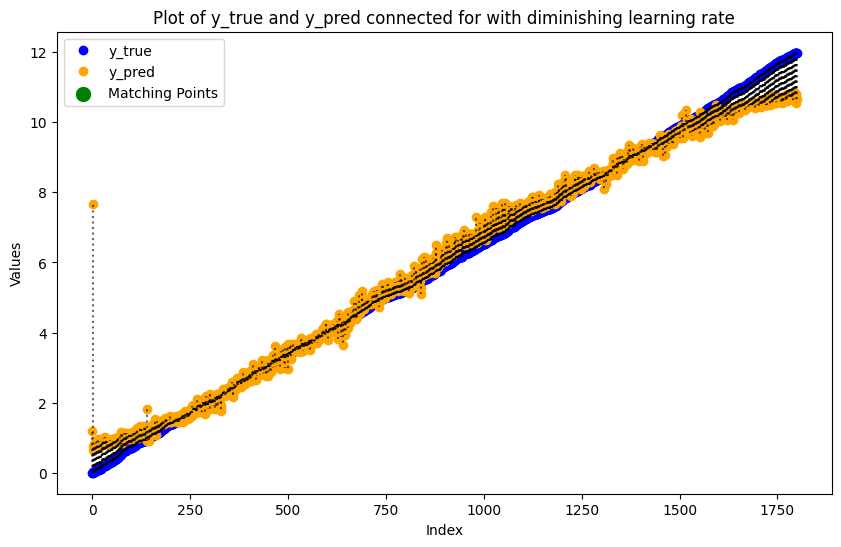

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

# Adding labels and legend
plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Plot of y_true and y_pred connected for with diminishing learning rate')
plt.legend()

# Show the plot
plt.show()

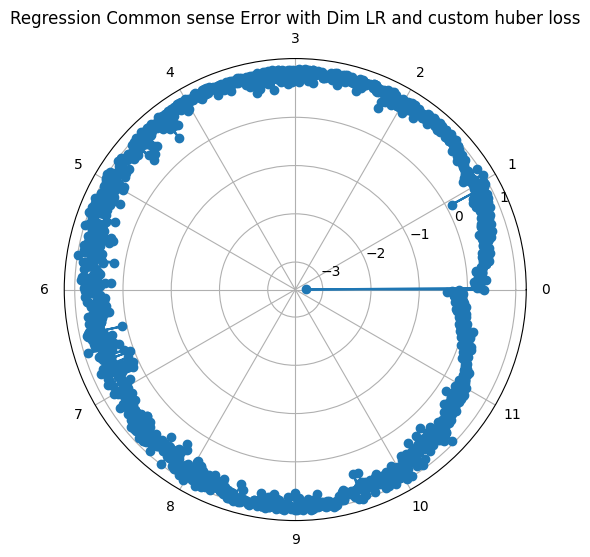

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = 1 - common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title("Regression Common sense Error with Dim LR and custom huber loss")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
# labels = np.array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])
# # values = np.array([.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5,10.5,11.5])  # Random values for each hour
# values = np.arange(12)
# vals = np.ones_like(values)
# # Angles for each bar
# angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
# print(values)
# # Plotting
# fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
# bars = ax.bar(values/12.0*2*np.pi , vals, color=plt.cm.viridis(values), alpha=0.7)

# # Label each bar with hour labels
# ax.set_xticks(angles)
# ax.set_xticklabels(labels)

# plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


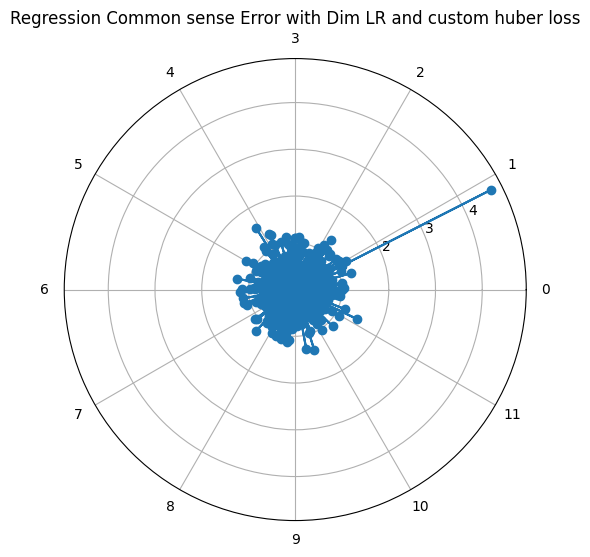

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title("Regression Common sense Error with Dim LR and custom huber loss")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

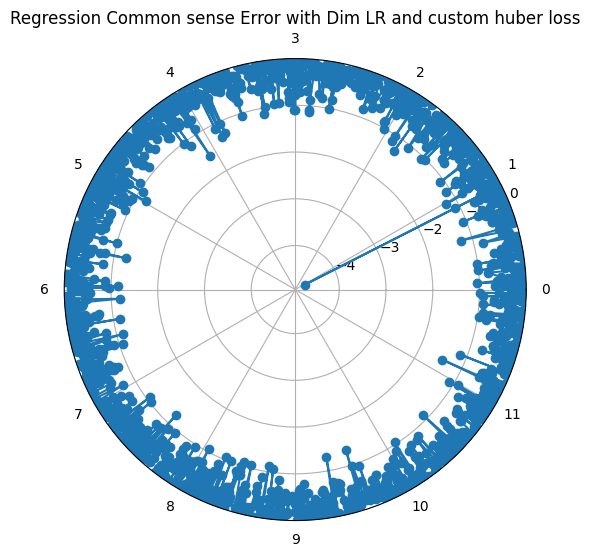

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title("Regression Common sense Error with Dim LR and custom huber loss")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(256, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    
    model.add(keras.layers.Dense(128, activation="relu"))
    model.add(keras.layers.Dropout(0.1))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
                                                  weight_decay=1e-5), 
                  loss='huber', metrics=['mae'])

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_20 (Conv2D)              │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_20          │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_21          │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_22          │ (None, 18, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_30 (Dropout)            │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_23          │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 20736)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 512)            │    10,617,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_32 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 1)              │           12

 Total params: 11,171,457 (42.62 MB)

 Trainable params: 11,170,497 (42.61 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)



history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 3.9046 - mae: 4.3779 - val_loss: 3.6925 - val_mae: 4.1632 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 2.6800 - mae: 3.1502 - val_loss: 4.3085 - val_mae: 4.7812 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 2.1837 - mae: 2.6442 - val_loss: 3.7558 - val_mae: 4.2287 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 1.8663 - mae: 2.3148 - val_loss: 3.6359 - val_mae: 4.1091 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 1.5873 - mae: 2.0251 - val_loss: 3.4299 - val_mae: 3.9006 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 1.4403 - mae: 1.8720 - val_loss: 3.3061 - val_mae: 3.7771 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 1.2742 - mae: 1.6970 - val_loss: 2.9866 - val_mae: 3.4564 - learning_rate

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

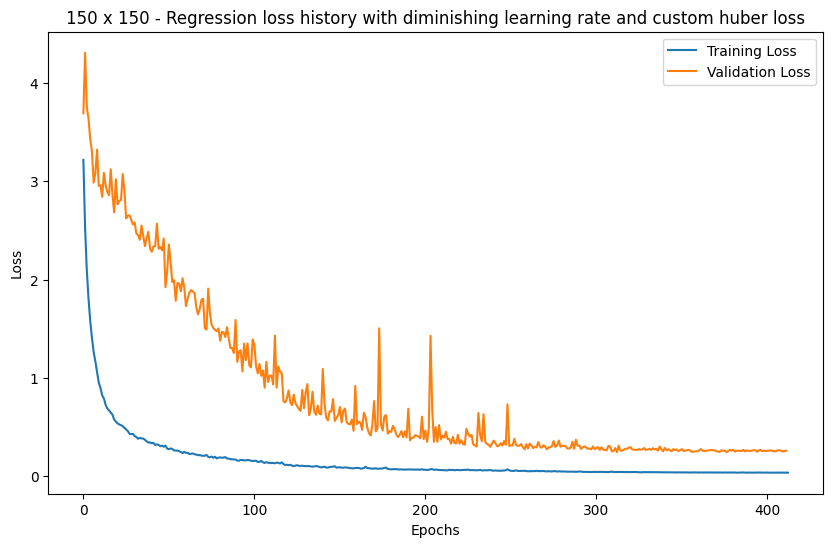

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.4896263903533088

Text(0.5, 1.0, 'Regression with diminishing learning rate with custom huber loss')

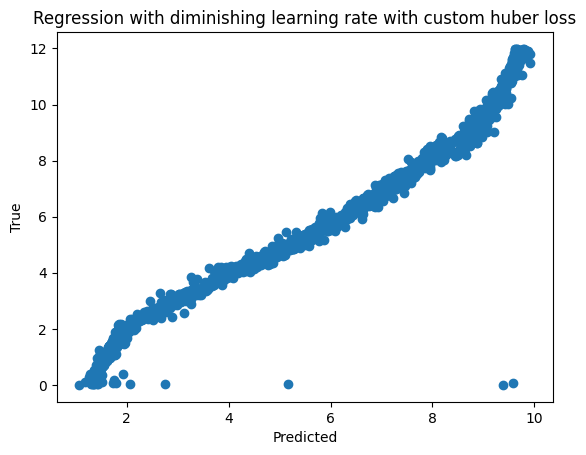

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Regression with diminishing learning rate with custom huber loss')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

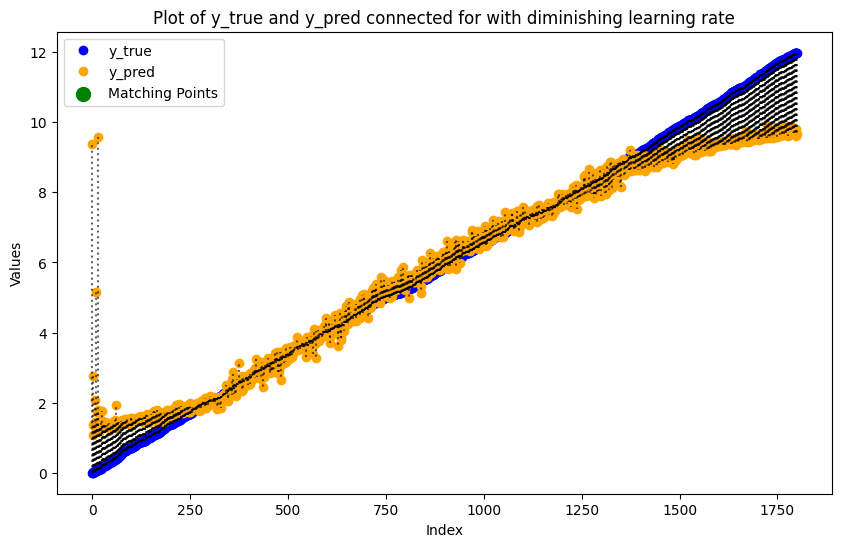

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Plot of y_true and y_pred connected for with diminishing learning rate')
plt.legend()

# Show the plot
plt.show()

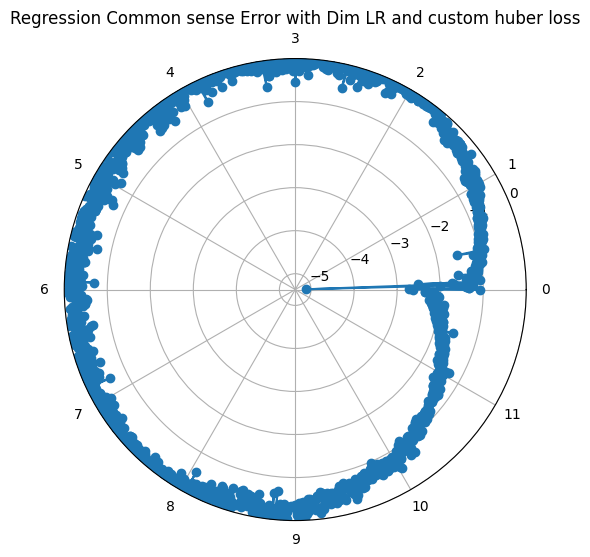

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title("Regression Common sense Error with Dim LR and custom huber loss")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

0.24418947100639343

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.04313949868083

In [ ]:
history.history['mae'][min_val_loss_index]

0.22475296258926392

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.5042753219604492

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.24418947100639343
Loss at this : 0.04313949868083
MAE : 0.22475296258926392
MAE Val : 0.5042753219604492
Common Sense MAE Train : 0.4932437017226484
Common Sense MAE Val : 0.4972956830069224
Common Sense MAE Test : 0.4896263903533088


In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images.npy")
labels = np.load("A1/data/labels.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 75, 75, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
                                                  weight_decay=1e-5), 
                  loss='huber', metrics=['mae'])

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_24 (Conv2D)              │ (None, 75, 75, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_24 (MaxPooling2D) │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_34 (Dropout)            │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_25 (MaxPooling2D) │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 18, 18, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 18, 18, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_35 (Dropout)            │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_26 (MaxPooling2D) │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_27 (Conv2D)              │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_36 (Dropout)            │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_27 (MaxPooling2D) │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_27          │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 512)            │     2,097,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_37 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_38 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,553,217 (9.74 MB)

 Trainable params: 2,552,257 (9.74 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)



history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 9s 13ms/step - loss: 2.9705 - mae: 3.4410 - val_loss: 3.3675 - val_mae: 3.8365 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 2.1416 - mae: 2.5992 - val_loss: 3.0770 - val_mae: 3.5508 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.9318 - mae: 2.3826 - val_loss: 3.4554 - val_mae: 3.9276 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.5956 - mae: 2.0341 - val_loss: 2.7266 - val_mae: 3.1943 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.3710 - mae: 1.7992 - val_loss: 2.2117 - val_mae: 2.6743 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.1731 - mae: 1.5922 - val_loss: 2.3463 - val_mae: 2.8047 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.0627 - mae: 1.4747 - val_loss: 2.5357 - val_mae: 3.0027 - learning_rate: 0.001

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

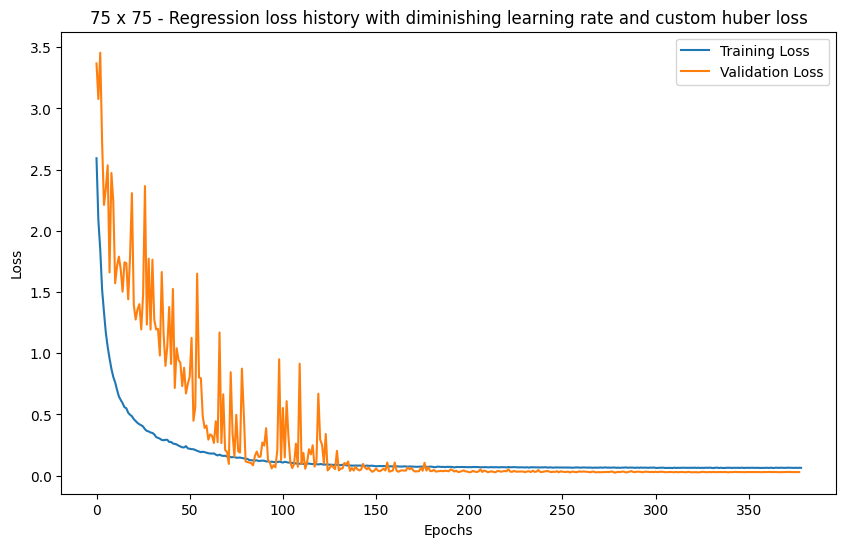

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.16208305825763278

Text(0.5, 1.0, 'Regression with diminishing learning rate with custom huber loss')

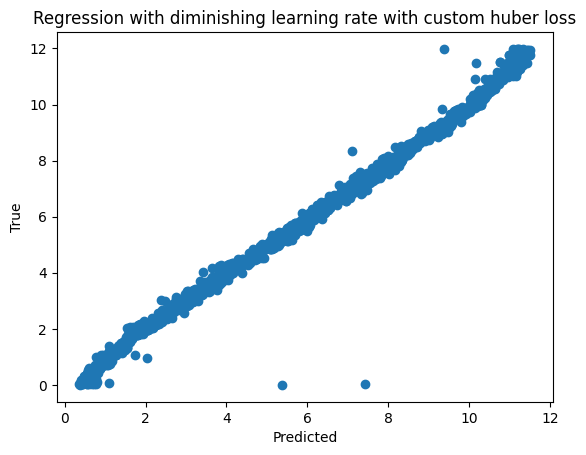

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Regression with diminishing learning rate with custom huber loss')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

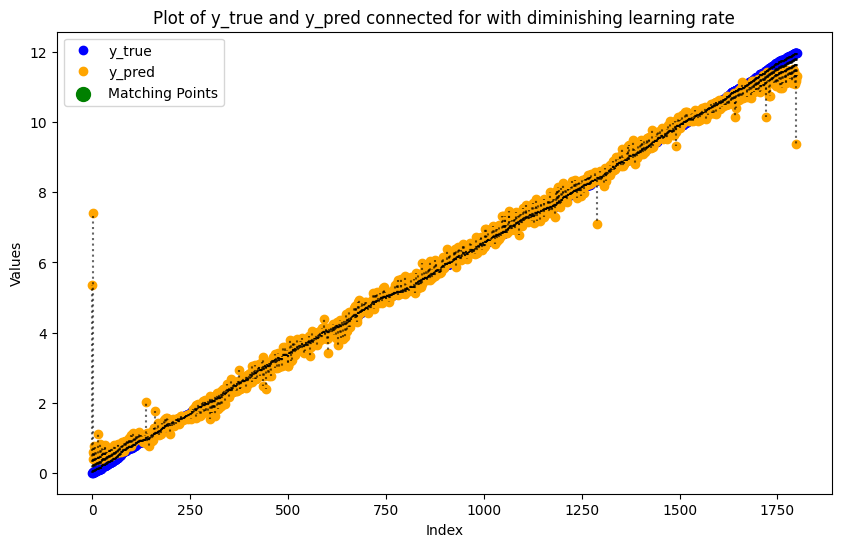

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Plot of y_true and y_pred connected for with diminishing learning rate')
plt.legend()

# Show the plot
plt.show()

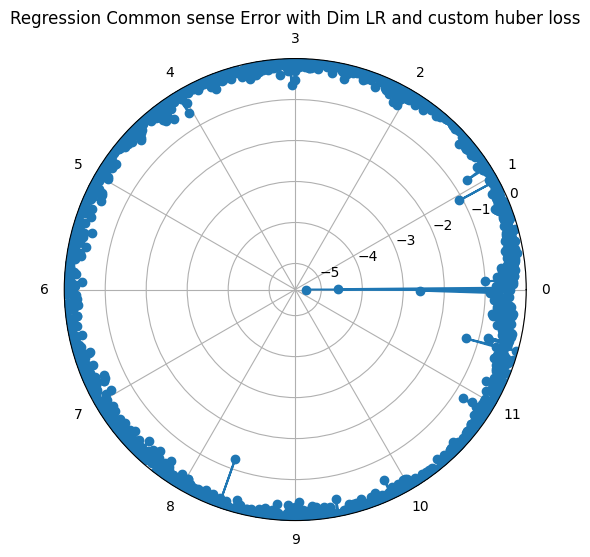

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title("Regression Common sense Error with Dim LR and custom huber loss")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

0.024135630577802658

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.06641410291194916

In [ ]:
history.history['mae'][min_val_loss_index]

0.2749653160572052

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.1573275625705719

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.024135630577802658
Loss at this : 0.06641410291194916
MAE : 0.2749653160572052
MAE Val : 0.1573275625705719
Common Sense MAE Train : 0.1366560932788849
Common Sense MAE Val : 0.15732822616789074
Common Sense MAE Test : 0.16208305825763278


In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
                                                  weight_decay=1e-5), 
                  loss='huber', metrics=['mae'])

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_28 (Conv2D)              │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_28          │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_39 (Dropout)            │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_29          │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_30 (Conv2D)              │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_40 (Dropout)            │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_30 (MaxPooling2D) │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_30          │ (None, 18, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_41 (Dropout)            │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_31 (MaxPooling2D) │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_31          │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 20736)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 512)            │    10,617,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_42 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_43 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,072,897 (42.24 MB)

 Trainable params: 11,071,937 (42.24 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)



history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 4.3435 - mae: 4.8178 - val_loss: 4.4128 - val_mae: 4.8861 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 2.4718 - mae: 2.9357 - val_loss: 3.9708 - val_mae: 4.4420 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 2.2662 - mae: 2.7250 - val_loss: 4.1559 - val_mae: 4.6290 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 1.9661 - mae: 2.4194 - val_loss: 3.9356 - val_mae: 4.4086 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 1.7951 - mae: 2.2418 - val_loss: 3.4030 - val_mae: 3.8739 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 1.5705 - mae: 2.0083 - val_loss: 3.3492 - val_mae: 3.8207 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 1.4418 - mae: 1.8727 - val_loss: 3.4554 - val_mae: 3.9283 - learning_rate

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

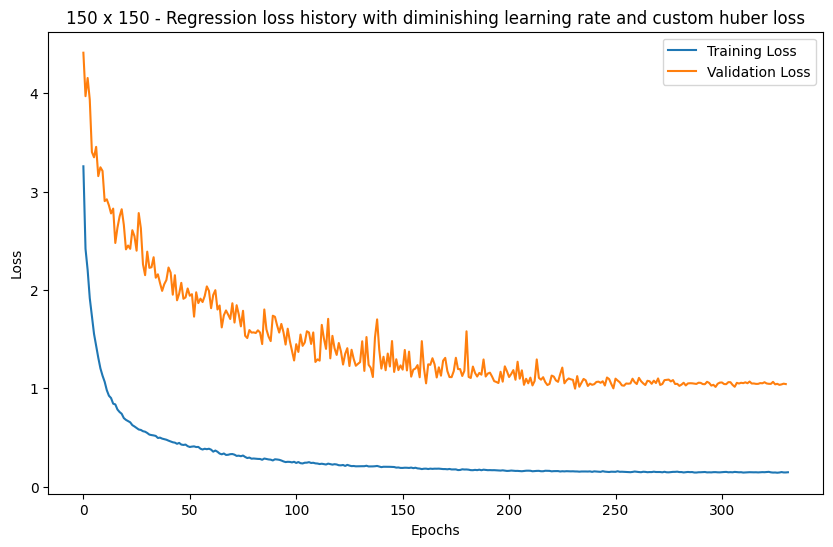

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

1.372193396713257

Text(0.5, 1.0, 'Regression with diminishing learning rate with custom huber loss')

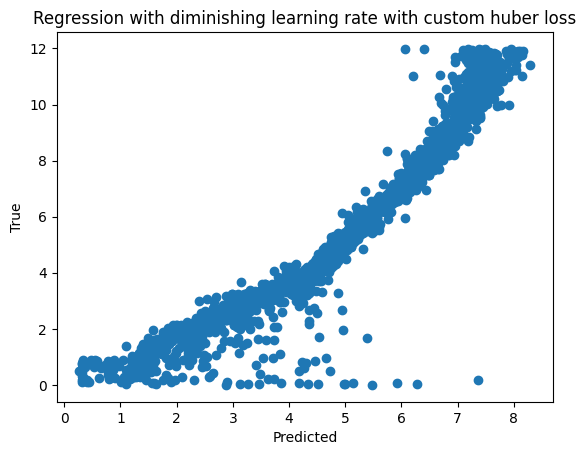

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Regression with diminishing learning rate with custom huber loss')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

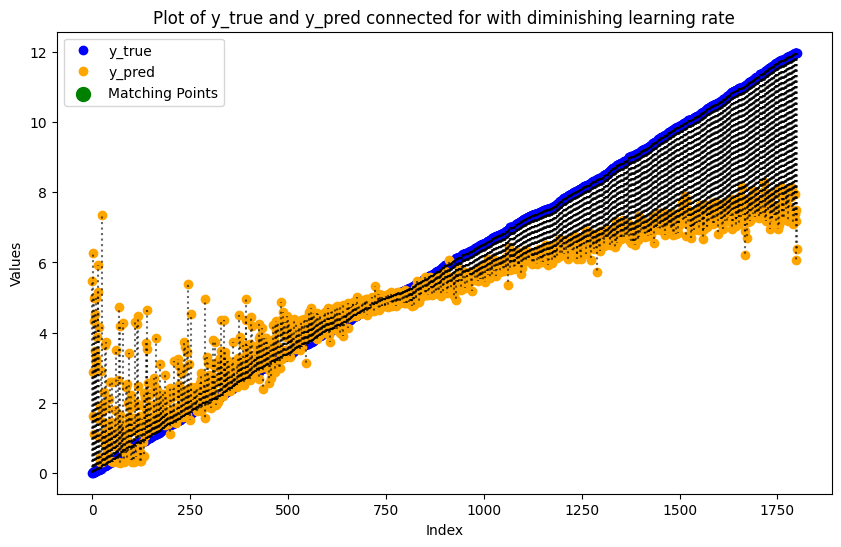

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Plot of y_true and y_pred connected for with diminishing learning rate')
plt.legend()

# Show the plot
plt.show()

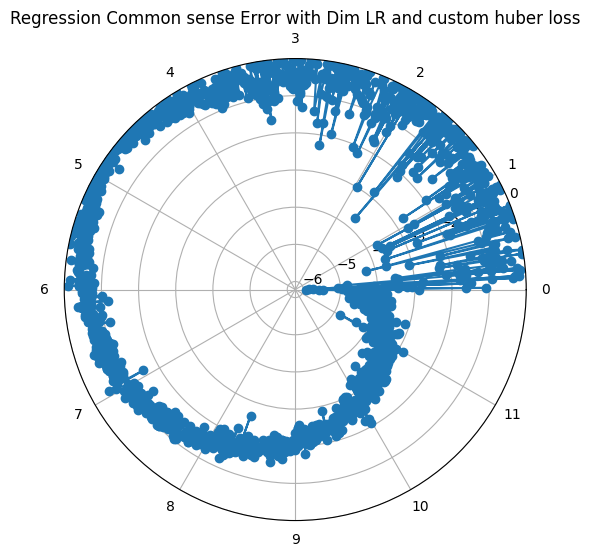

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title("Regression Common sense Error with Dim LR and custom huber loss")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

0.9964842796325684

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.15475474298000336

In [ ]:
history.history['mae'][min_val_loss_index]

0.42462414503097534

In [ ]:
history.history['val_mae'][min_val_loss_index]

1.3910846710205078

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.9964842796325684
Loss at this : 0.15475474298000336
MAE : 0.42462414503097534
MAE Val : 1.3910846710205078
Common Sense MAE Train : 1.3382686605299579
Common Sense MAE Val : 1.3910914691899618
Common Sense MAE Test : 1.372193396713257


Connected to .venv (Python 3.10.7)

Connected to .venv (Python 3.10.7)

In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

2024-11-06 17:00:09.666169: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-06 17:00:09.688847: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-06 17:00:09.716814: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-06 17:00:09.723362: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-06 17:00:09.740325: I tensorflow/core/platform/cpu_feature_guar

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())
    
    
    model.add(keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    # model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    # model.add(keras.layers.Dropout(0.3))
    # model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    # model.add(keras.layers.BatchNormalization())

    # model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    # model.add(keras.layers.Dropout(0.3))
    # model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    # model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    # model.add(keras.layers.Dense(128, activation='relu'))
    # model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer="adam", loss='mse', metrics=['mae'])

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2024-11-06 17:00:18.758789: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22461 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:3b:00.0, compute capability: 8.6
2024-11-06 17:00:18.759818: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22461 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:af:00.0, compute capability: 8.6


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 18, 18, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 20736)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    10,617,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,646,433 (40.61 MB)

 Trainable params: 10,646,177 (40.61 MB)

 Non-trainable params: 256 (1.00 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)



history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500


I0000 00:00:1730930423.752788   40174 service.cc:146] XLA service 0x7fa9380018b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730930423.752946   40174 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1730930423.752951   40174 service.cc:154]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-11-06 17:00:23.852611: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-06 17:00:24.180347: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907


 13/225 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 2286.0217 - mae: 24.5583

I0000 00:00:1730930428.669682   40174 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


225/225 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 319.7590 - mae: 6.4588 - val_loss: 54.0125 - val_mae: 6.4771 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 13.9899 - mae: 3.1044 - val_loss: 46.7211 - val_mae: 5.8882 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 12.3939 - mae: 2.8837 - val_loss: 33.6123 - val_mae: 4.8357 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 10.8963 - mae: 2.6676 - val_loss: 23.5195 - val_mae: 3.9945 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 10.1863 - mae: 2.5705 - val_loss: 20.9804 - val_mae: 3.7593 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 10.1866 - mae: 2.5509 - val_loss: 13.6046 - val_mae: 2.9879 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 9.5176 - mae: 2.4538 - val_loss: 14.5410 - val_mae: 3.1261 - learning_ra

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

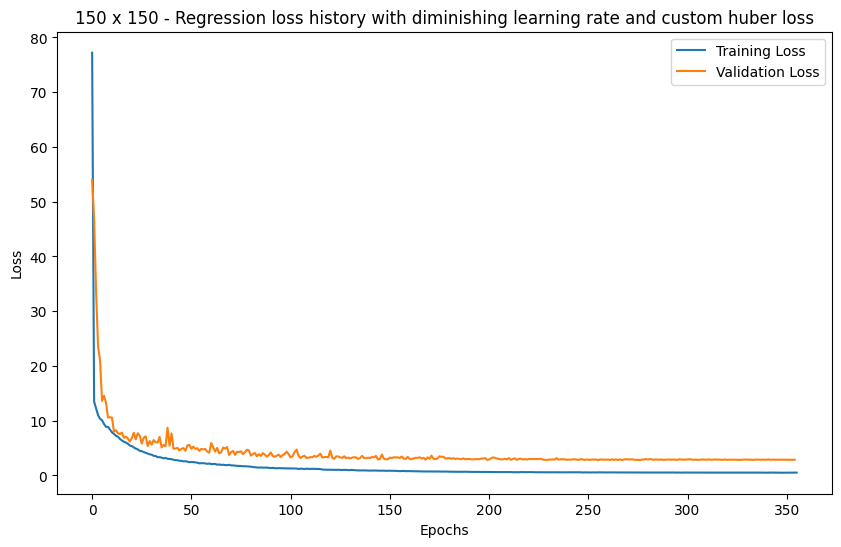

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

1.088115788567437

Text(0.5, 1.0, 'Regression with diminishing learning rate with custom huber loss')

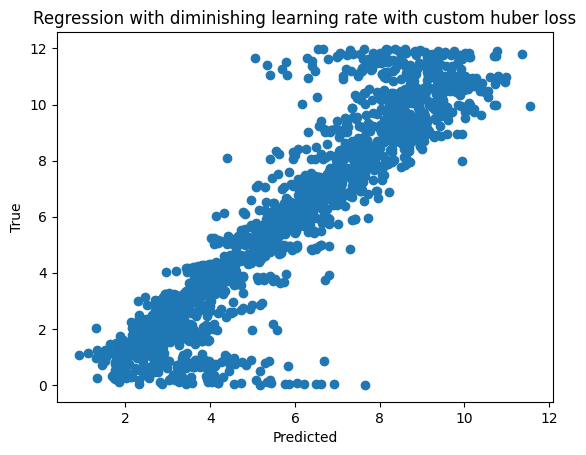

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Regression with diminishing learning rate with custom huber loss')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

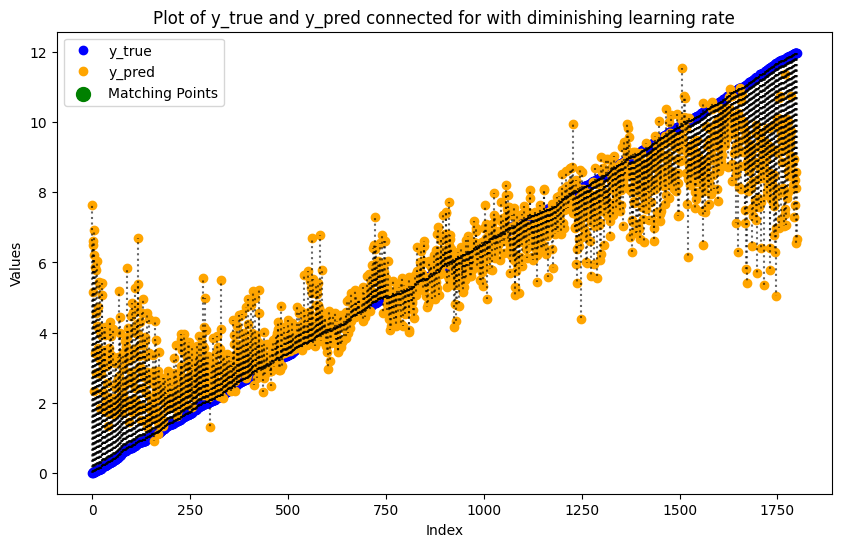

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Plot of y_true and y_pred connected for with diminishing learning rate')
plt.legend()

# Show the plot
plt.show()

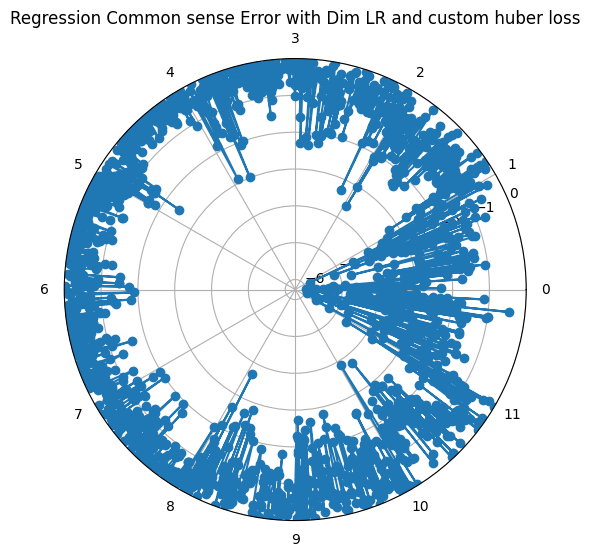

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title("Regression Common sense Error with Dim LR and custom huber loss")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

2.7891926765441895

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.5624560713768005

In [ ]:
history.history['mae'][min_val_loss_index]

0.5521626472473145

In [ ]:
history.history['val_mae'][min_val_loss_index]

1.1652261018753052

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 2.7891926765441895
Loss at this : 0.5624560713768005
MAE : 0.5521626472473145
MAE Val : 1.1652261018753052
Common Sense MAE Train : 0.5337262531097465
Common Sense MAE Val : 1.1570721956335703
Common Sense MAE Test : 1.088115788567437


In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())
    
    
    model.add(keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    # model.add(keras.layers.Dense(128, activation='relu'))
    # model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer="adam", loss='mse', metrics=['mae'])

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 75, 75, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 18, 18, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 18, 18, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     2,097,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 2,497,313 (9.53 MB)

 Trainable params: 2,496,289 (9.52 MB)

 Non-trainable params: 1,024 (4.00 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)



history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 22.2589 - mae: 3.4006 - val_loss: 12.8604 - val_mae: 3.0842 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 9.1711 - mae: 2.4175 - val_loss: 13.7200 - val_mae: 3.1583 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 7.5660 - mae: 2.1426 - val_loss: 10.4905 - val_mae: 2.7177 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 6.3372 - mae: 1.9371 - val_loss: 10.0127 - val_mae: 2.6076 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 5.3077 - mae: 1.7462 - val_loss: 6.3337 - val_mae: 2.0125 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 4.4795 - mae: 1.6054 - val_loss: 5.8877 - val_mae: 1.8365 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 3.8799 - mae: 1.4749 - val_loss: 6.7629 - val_mae: 1.9675 - learning

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

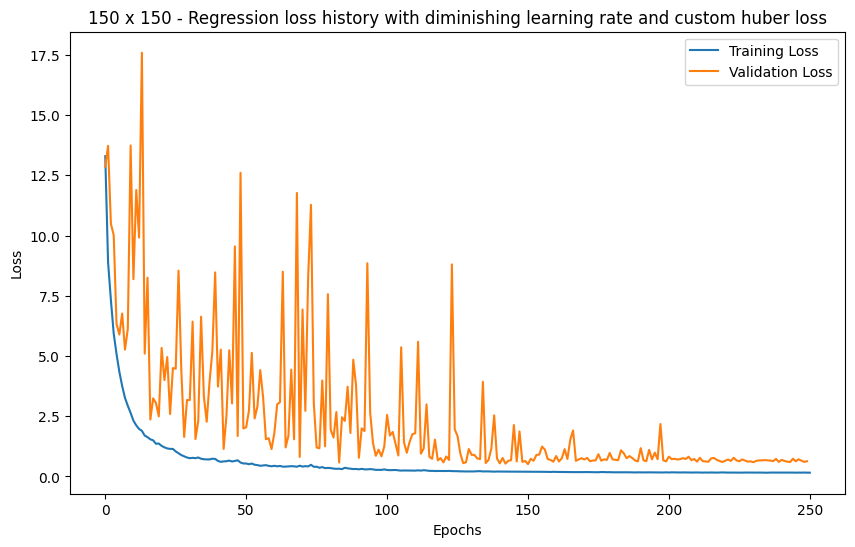

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.4549575649989446

Text(0.5, 1.0, 'Regression with diminishing learning rate with custom huber loss')

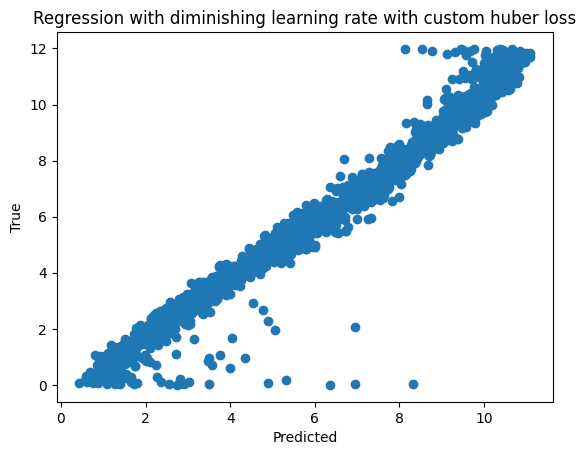

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Regression with diminishing learning rate with custom huber loss')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

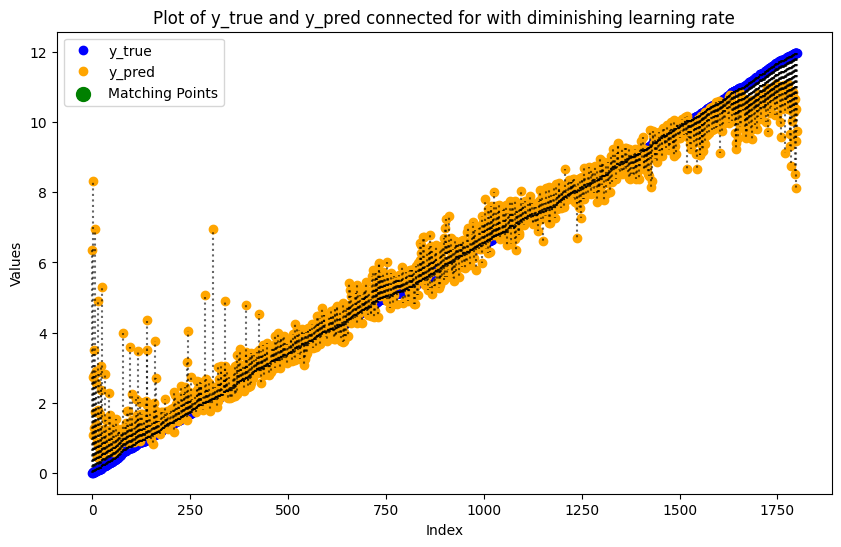

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Plot of y_true and y_pred connected for with diminishing learning rate')
plt.legend()

# Show the plot
plt.show()

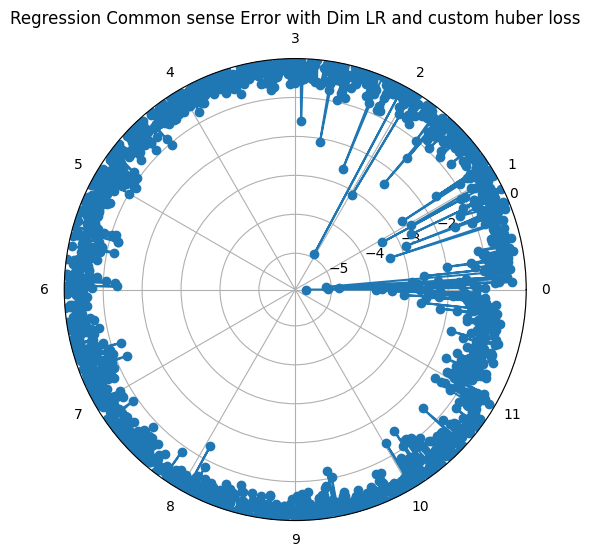

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title("Regression Common sense Error with Dim LR and custom huber loss")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

0.5092170834541321

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.19556520879268646

In [ ]:
history.history['mae'][min_val_loss_index]

0.3329441547393799

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.46442222595214844

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.5092170834541321
Loss at this : 0.19556520879268646
MAE : 0.3329441547393799
MAE Val : 0.46442222595214844
Common Sense MAE Train : 0.39893249262705116
Common Sense MAE Val : 0.4598054671684901
Common Sense MAE Test : 0.4549575649989446


In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())
    
    
    model.add(keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer="adam", loss='mse', metrics=['mae'])

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)               │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 75, 75, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 18, 18, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 18, 18, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │     2,097,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 2,562,593 (9.78 MB)

 Trainable params: 2,561,569 (9.77 MB)

 Non-trainable params: 1,024 (4.00 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)



history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
223/225 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 17.2318 - mae: 3.3468

2024-11-06 18:07:01.681169: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_182', 8 bytes spill stores, 8 bytes spill loads



225/225 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 17.1837 - mae: 3.3422 - val_loss: 21.5812 - val_mae: 3.7891 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 10.8140 - mae: 2.6331 - val_loss: 18.7143 - val_mae: 3.5594 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 8.9727 - mae: 2.3672 - val_loss: 20.5913 - val_mae: 3.6989 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 7.2989 - mae: 2.0910 - val_loss: 15.4787 - val_mae: 3.2437 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 5.8445 - mae: 1.8473 - val_loss: 10.9340 - val_mae: 2.7116 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 4.9710 - mae: 1.6822 - val_loss: 9.8325 - val_mae: 2.5510 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 4.1576 - mae: 1.5279 - val_loss: 14.9858 - val_mae: 3.2181 - learning_rate: 0.

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

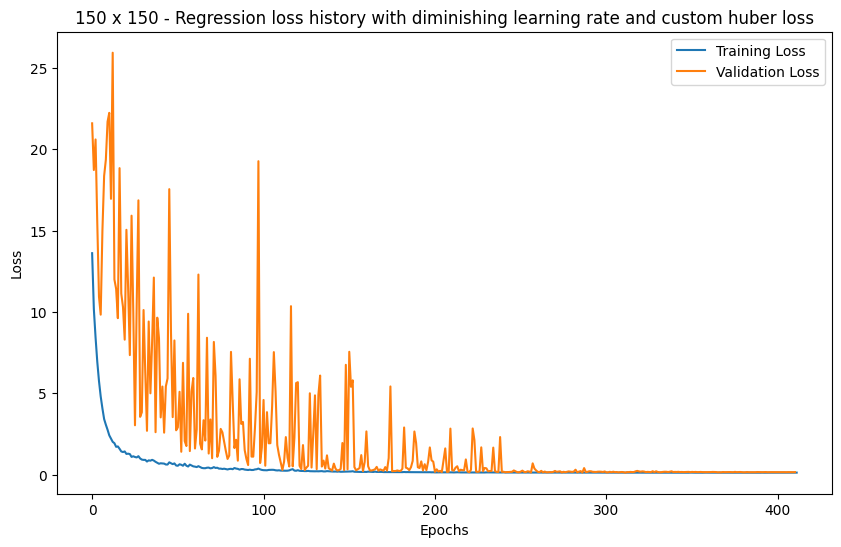

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.24779715238655936

Text(0.5, 1.0, 'Regression with diminishing learning rate with custom huber loss')

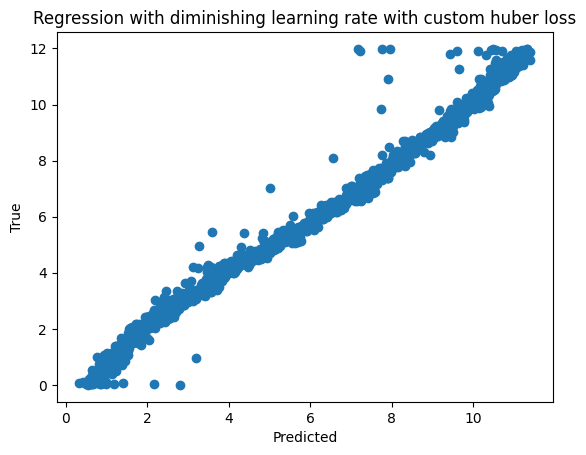

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Regression with diminishing learning rate with custom huber loss')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

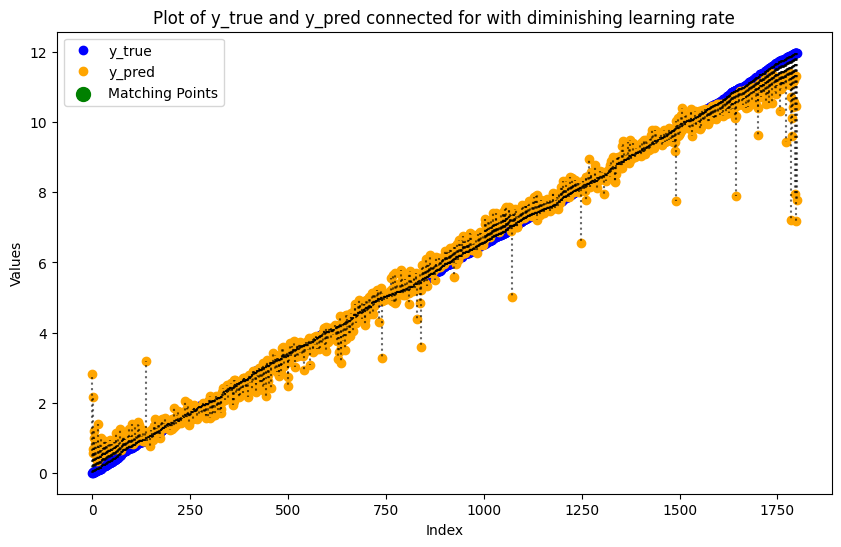

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Plot of y_true and y_pred connected for with diminishing learning rate')
plt.legend()

# Show the plot
plt.show()

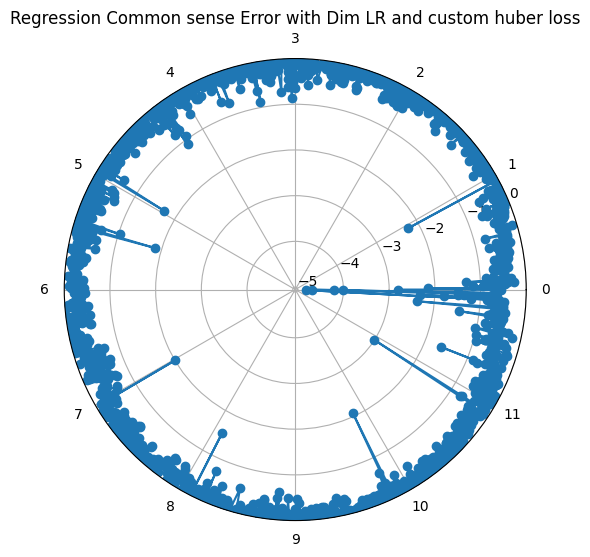

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title("Regression Common sense Error with Dim LR and custom huber loss")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

0.13306137919425964

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.13481664657592773

In [ ]:
history.history['mae'][min_val_loss_index]

0.27321866154670715

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.24367010593414307

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.13306137919425964
Loss at this : 0.13481664657592773
MAE : 0.27321866154670715
MAE Val : 0.24367010593414307
Common Sense MAE Train : 0.22256136247285205
Common Sense MAE Val : 0.24366968790541754
Common Sense MAE Test : 0.24779715238655936


In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

2024-11-07 05:54:51.602278: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-07 05:54:51.619818: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-07 05:54:51.643031: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-07 05:54:51.650146: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-07 05:54:51.668211: I tensorflow/core/platform/cpu_feature_guar

In [ ]:
images = np.load("A1/data/images.npy")
labels = np.load("A1/data/labels.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 75, 75, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
# optimizer = keras.optimizers.Adam(learning_rate=1e-3,  weight_decay=1e-5)
optimizer = "adam"
loss_function = "mse"
metrics = ["mae"]

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2024-11-07 05:54:56.416348: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1644 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:3b:00.0, compute capability: 8.6
2024-11-07 05:54:56.416884: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 21945 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:af:00.0, compute capability: 8.6


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 75, 75, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 18, 18, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 18, 18, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     2,097,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,553,217 (9.74 MB)

 Trainable params: 2,552,257 (9.74 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)



history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500


I0000 00:00:1730976901.866861   33945 service.cc:146] XLA service 0x7f3468001520 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730976901.866931   33945 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1730976901.866959   33945 service.cc:154]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-11-07 05:55:01.984311: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-07 05:55:02.444749: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907


 15/225 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 44.3212 - mae: 5.0982

I0000 00:00:1730976909.391079   33945 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


222/225 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 18.5813 - mae: 3.4192

2024-11-07 05:55:15.710316: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_151', 8 bytes spill stores, 8 bytes spill loads



225/225 ━━━━━━━━━━━━━━━━━━━━ 18s 35ms/step - loss: 18.5034 - mae: 3.4130 - val_loss: 18.2832 - val_mae: 3.5230 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 10.9438 - mae: 2.6676 - val_loss: 21.7457 - val_mae: 3.8018 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 9.3533 - mae: 2.4118 - val_loss: 18.9086 - val_mae: 3.5545 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 7.7068 - mae: 2.1604 - val_loss: 12.8552 - val_mae: 2.9272 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 6.3404 - mae: 1.9315 - val_loss: 14.8063 - val_mae: 3.1461 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 5.4730 - mae: 1.7581 - val_loss: 15.8597 - val_mae: 3.2928 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 4.4709 - mae: 1.5965 - val_loss: 6.8568 - val_mae: 2.1230 - learning_rate: 0.0010

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

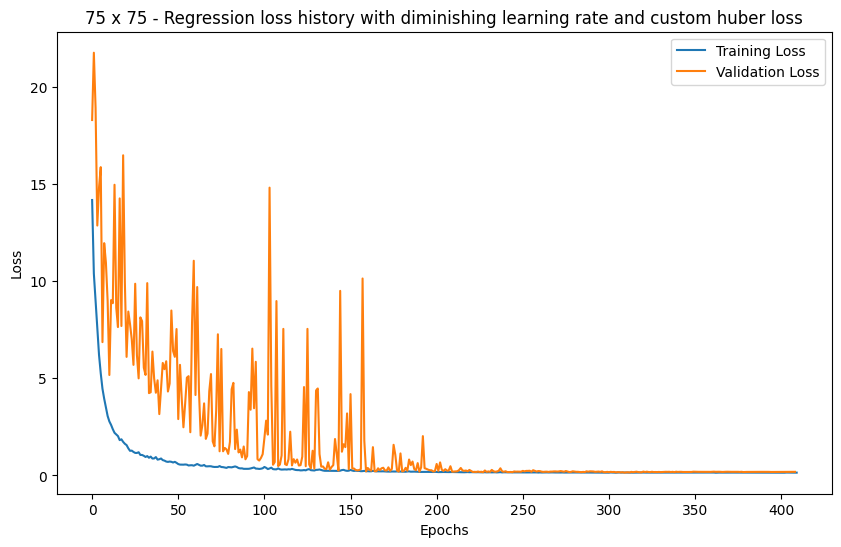

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.23155334309005737

Text(0.5, 1.0, 'Regression with diminishing learning rate with mse')

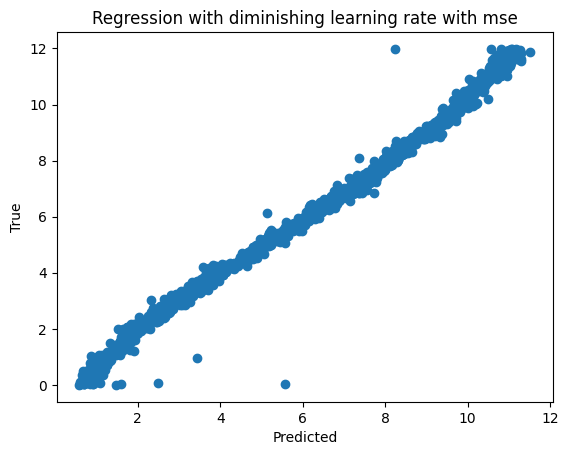

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'Regression with diminishing learning rate with {loss_function}')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

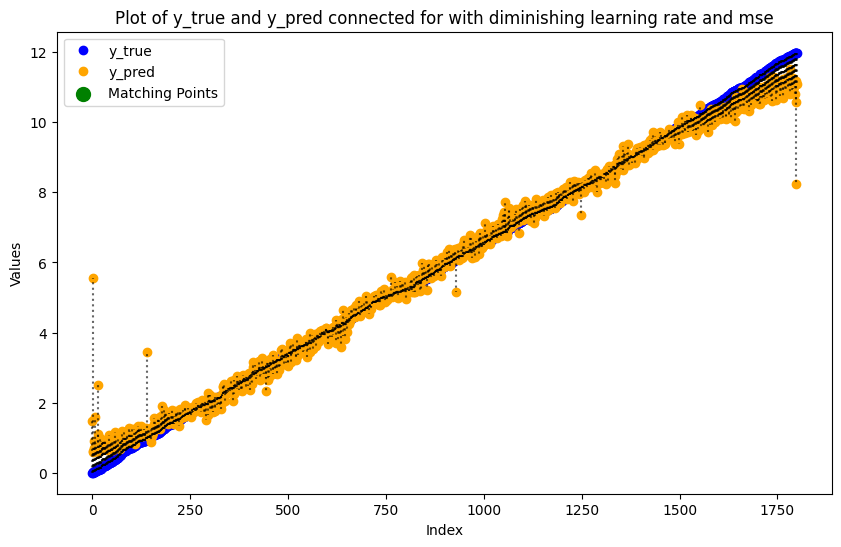

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title(f'Plot of y_true and y_pred connected for with diminishing learning rate and {loss_function}')
plt.legend()

# Show the plot
plt.show()

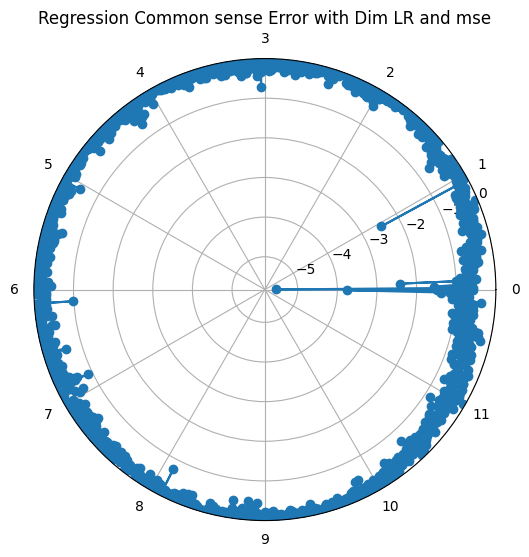

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title(f"Regression Common sense Error with Dim LR and {loss_function}")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

0.14345373213291168

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.14953307807445526

In [ ]:
history.history['mae'][min_val_loss_index]

0.29095232486724854

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.2296867072582245

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.14345373213291168
Loss at this : 0.14953307807445526
MAE : 0.29095232486724854
MAE Val : 0.2296867072582245
Common Sense MAE Train : 0.2050682215757105
Common Sense MAE Val : 0.22789108479351466
Common Sense MAE Test : 0.23155334309005737


Connected to .venv (Python 3.10.7)

In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

2024-11-07 06:33:00.970342: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-07 06:33:00.986605: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-07 06:33:01.009073: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-07 06:33:01.016009: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-07 06:33:01.033700: I tensorflow/core/platform/cpu_feature_guar

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
# optimizer = keras.optimizers.Adam(learning_rate=1e-3,  weight_decay=1e-5)
optimizer = "adam"
loss_function = "mse"
metrics = ["mae"]

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2024-11-07 06:33:26.312175: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22461 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:3b:00.0, compute capability: 8.6
2024-11-07 06:33:26.312770: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22461 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:af:00.0, compute capability: 8.6


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 18, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 20736)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    10,617,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,072,897 (42.24 MB)

 Trainable params: 11,071,937 (42.24 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)

In [ ]:
history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500


I0000 00:00:1730979226.841077   10341 service.cc:146] XLA service 0x7efbb8005b70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730979226.841147   10341 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1730979226.841160   10341 service.cc:154]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-11-07 06:33:46.962824: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-07 06:33:47.349042: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907


 10/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 223.6185 - mae: 10.4718

I0000 00:00:1730979233.912983   10341 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


223/225 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 42.3227 - mae: 4.3287

2024-11-07 06:34:01.902980: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_151', 8 bytes spill stores, 8 bytes spill loads



225/225 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step - loss: 42.0378 - mae: 4.3168 - val_loss: 33.7669 - val_mae: 4.8068 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 12.3585 - mae: 2.8552 - val_loss: 23.7515 - val_mae: 3.9594 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 10.7065 - mae: 2.6360 - val_loss: 21.5059 - val_mae: 3.7807 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 9.3929 - mae: 2.4397 - val_loss: 18.3262 - val_mae: 3.4877 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 8.2514 - mae: 2.2443 - val_loss: 16.9926 - val_mae: 3.3691 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 7.3382 - mae: 2.1009 - val_loss: 14.1483 - val_mae: 3.0936 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 6.4684 - mae: 1.9586 - val_loss: 13.2969 - val_mae: 2.9876 - learning_rate: 

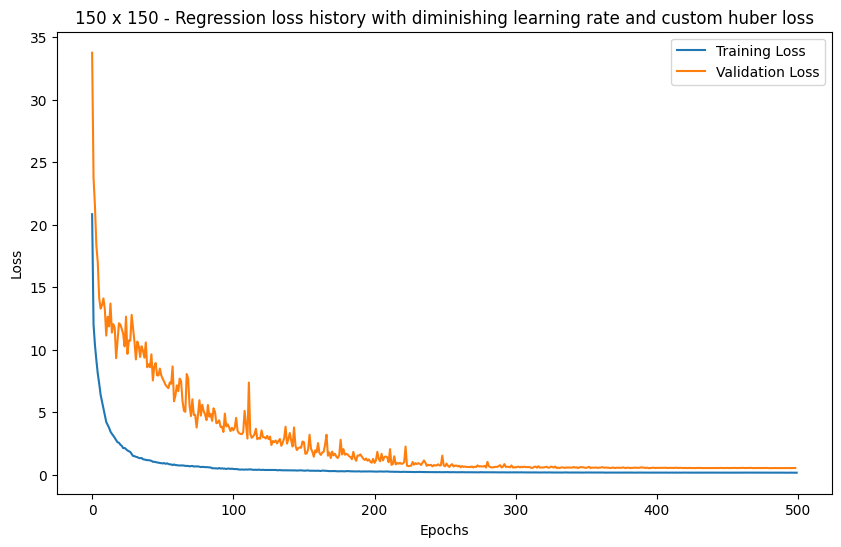

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.41536779351340397

Text(0.5, 1.0, 'Regression with diminishing learning rate with mse')

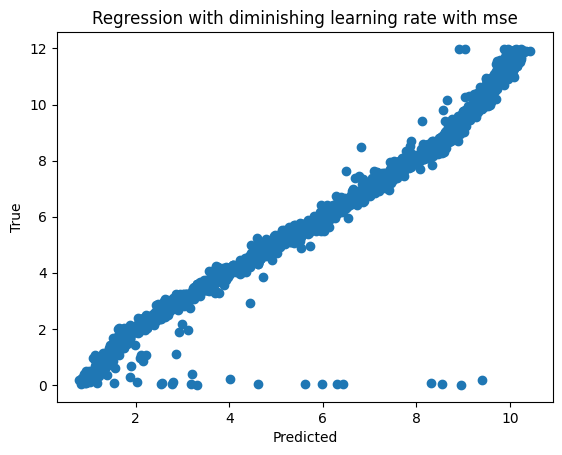

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'Regression with diminishing learning rate with {loss_function}')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

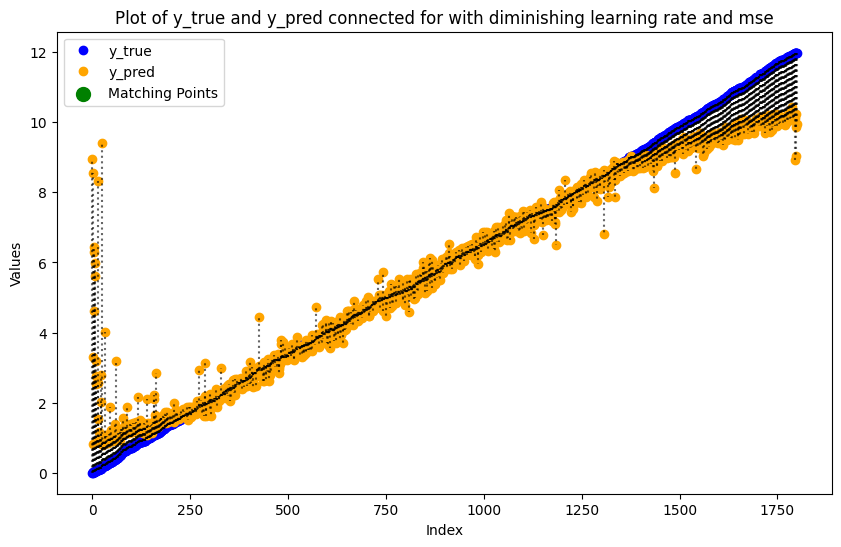

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title(f'Plot of y_true and y_pred connected for with diminishing learning rate and {loss_function}')
plt.legend()

# Show the plot
plt.show()

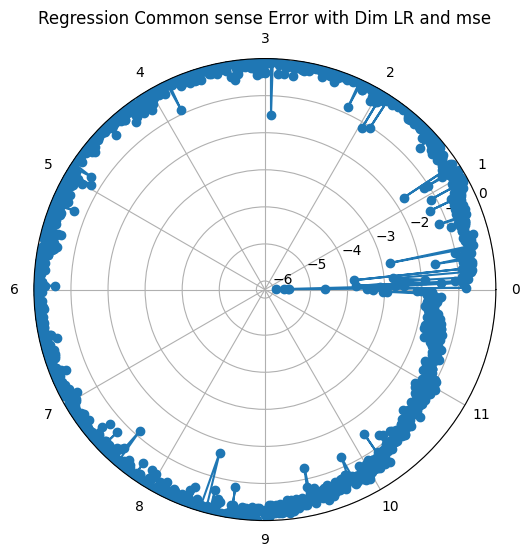

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title(f"Regression Common sense Error with Dim LR and {loss_function}")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

0.5289357900619507

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.1728961318731308

In [ ]:
history.history['mae'][min_val_loss_index]

0.3082709312438965

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.4262615740299225

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.5289357900619507
Loss at this : 0.1728961318731308
MAE : 0.3082709312438965
MAE Val : 0.4262615740299225
Common Sense MAE Train : 0.3667920875179503
Common Sense MAE Val : 0.42057861744456815
Common Sense MAE Test : 0.41536779351340397


Connected to .venv (Python 3.10.7)

In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

2024-11-07 07:21:20.608401: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-07 07:21:20.625712: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-07 07:21:20.647091: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-07 07:21:20.653736: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-07 07:21:20.670856: I tensorflow/core/platform/cpu_feature_guar

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
# optimizer = keras.optimizers.Adam(learning_rate=1e-3,  weight_decay=1e-5)
optimizer = keras.optimizers.Adam(learning_rate=1e-3, weight_decay=1e-5)
loss_function = reg_loss_funtion
metrics = ["mae"]

2024-11-07 07:21:38.964767: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1015 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:3b:00.0, compute capability: 8.6
2024-11-07 07:21:38.965732: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 9981 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:af:00.0, compute capability: 8.6


In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 18, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 20736)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    10,617,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,072,897 (42.24 MB)

 Trainable params: 11,071,937 (42.24 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

2024-11-07 07:26:36.010989: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-07 07:26:36.033777: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-07 07:26:36.063126: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-07 07:26:36.072031: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-07 07:26:36.096800: I tensorflow/core/platform/cpu_feature_guar

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
# optimizer = keras.optimizers.Adam(learning_rate=1e-3,  weight_decay=1e-5)
optimizer = keras.optimizers.Adam(learning_rate=1e-3, weight_decay=1e-5)
loss_function = reg_loss_funtion
metrics = ["mae"]

2024-11-07 07:26:41.488666: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22461 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:3b:00.0, compute capability: 8.6
2024-11-07 07:26:41.489475: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 6163 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:af:00.0, compute capability: 8.6


In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 18, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 20736)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    10,617,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,072,897 (42.24 MB)

 Trainable params: 11,071,937 (42.24 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)

In [ ]:
history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500


I0000 00:00:1730982421.781755   36898 service.cc:146] XLA service 0x7f19d4017820 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730982421.781834   36898 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1730982421.781848   36898 service.cc:154]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-11-07 07:27:01.924205: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-07 07:27:02.456765: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907


  7/225 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 131.7516 - mae: 9.2836

I0000 00:00:1730982430.414777   36898 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


223/225 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 30.2175 - mae: 4.6267

2024-11-07 07:27:18.964617: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_151', 8 bytes spill stores, 8 bytes spill loads



225/225 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - loss: 30.0648 - mae: 4.6186 - val_loss: 11.8427 - val_mae: 5.0170 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 13.5143 - mae: 3.7761 - val_loss: 11.8560 - val_mae: 5.0812 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 12.3885 - mae: 3.7592 - val_loss: 12.0087 - val_mae: 5.2965 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 10.5037 - mae: 3.3657 - val_loss: 11.9603 - val_mae: 4.6990 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 9.0523 - mae: 3.1938 - val_loss: 11.7708 - val_mae: 4.8322 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 8.2698 - mae: 3.1835 - val_loss: 12.0240 - val_mae: 4.8869 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 7.4390 - mae: 3.1603 - val_loss: 11.4748 - val_mae: 4.8615 - learning_rate:

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(64, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 150, 150, 64)   │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 75, 75, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 18, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 20736)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │    10,617,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,235,653 (126.78 MB)

 Trainable params: 11,090,753 (42.31 MB)

 Non-trainable params: 1,024 (4.00 KB)

 Optimizer params: 22,143,876 (84.47 MB)

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

def split_time_to_regression(row):
    return row[0], row[1]

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(split_time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

Restarted .venv (Python 3.10.7)

In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

2024-11-07 08:29:18.103219: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-07 08:29:18.119860: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-07 08:29:18.141580: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-07 08:29:18.148186: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-07 08:29:18.166253: I tensorflow/core/platform/cpu_feature_guar

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
# optimizer = keras.optimizers.Adam(learning_rate=1e-3,  weight_decay=1e-5)
optimizer = "adam"
loss_function = "mse"
metrics = ["mae"]

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(3, 3),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (5, 5), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (5, 5), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (5, 5), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2024-11-07 08:29:25.822878: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22461 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:3b:00.0, compute capability: 8.6
2024-11-07 08:29:25.823433: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22461 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:af:00.0, compute capability: 8.6


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 64)     │        51,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 18, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 18, 18, 256)    │       819,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 20736)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    10,617,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,761,025 (44.86 MB)

 Trainable params: 11,760,065 (44.86 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)

In [ ]:
history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500


I0000 00:00:1730986172.535252     639 service.cc:146] XLA service 0x7f150c001370 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730986172.535308     639 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1730986172.535316     639 service.cc:154]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-11-07 08:29:32.666897: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-07 08:29:33.091098: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907


  6/225 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 635.5230 - mae: 16.0821

I0000 00:00:1730986180.874180     639 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


223/225 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 77.2684 - mae: 4.8018

2024-11-07 08:29:50.043605: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_151', 8 bytes spill stores, 8 bytes spill loads



225/225 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - loss: 76.6217 - mae: 4.7865 - val_loss: 29.4801 - val_mae: 4.4454 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 13.9593 - mae: 3.0918 - val_loss: 29.9058 - val_mae: 4.4766 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 12.2280 - mae: 2.8591 - val_loss: 33.1895 - val_mae: 4.7719 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 11.0655 - mae: 2.6876 - val_loss: 27.0007 - val_mae: 4.2846 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 10.4875 - mae: 2.5914 - val_loss: 27.3333 - val_mae: 4.3433 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 9.3036 - mae: 2.4000 - val_loss: 18.1250 - val_mae: 3.4749 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 7.9544 - mae: 2.1878 - val_loss: 24.7599 - val_mae: 4.1262 - learning_rate

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

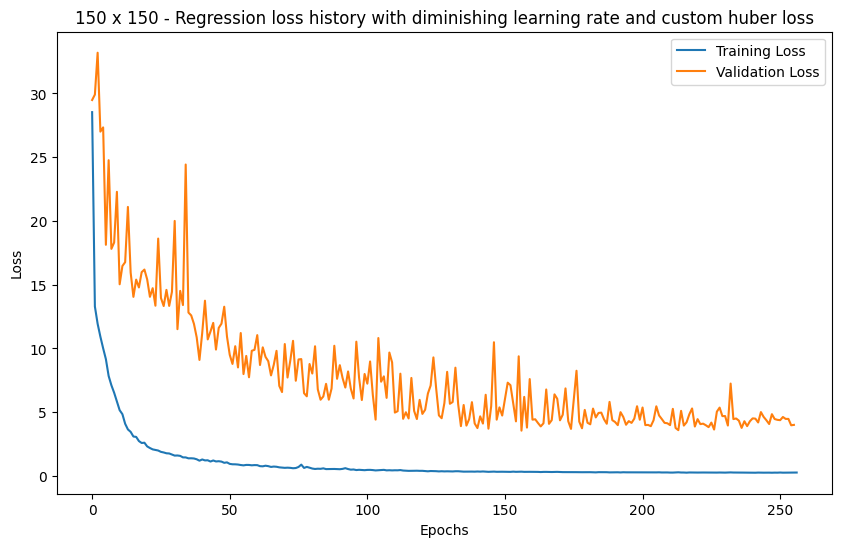

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

1.3990428665150536

Text(0.5, 1.0, 'Regression with diminishing learning rate with mse')

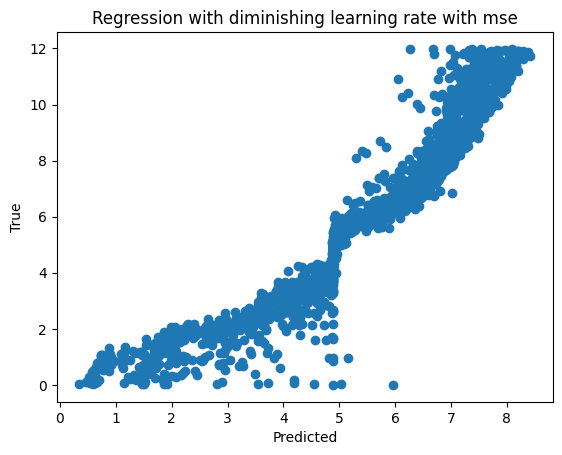

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'Regression with diminishing learning rate with {loss_function}')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

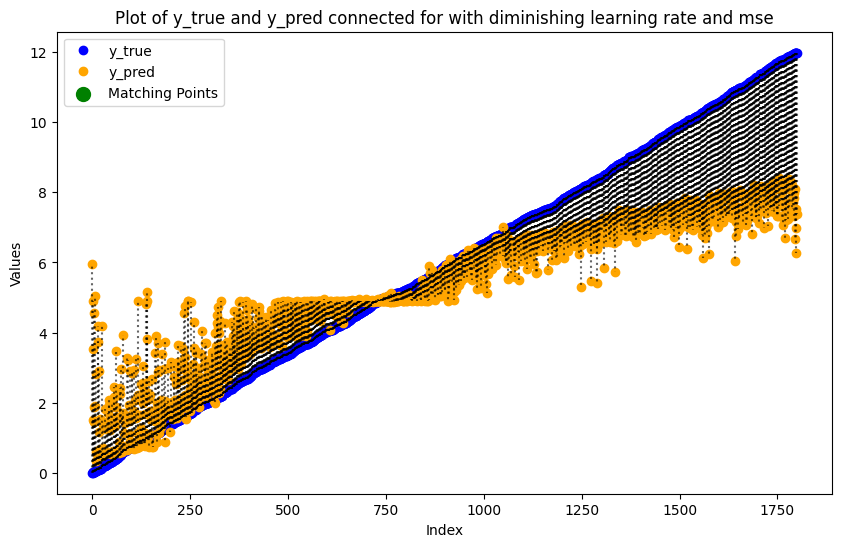

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title(f'Plot of y_true and y_pred connected for with diminishing learning rate and {loss_function}')
plt.legend()

# Show the plot
plt.show()

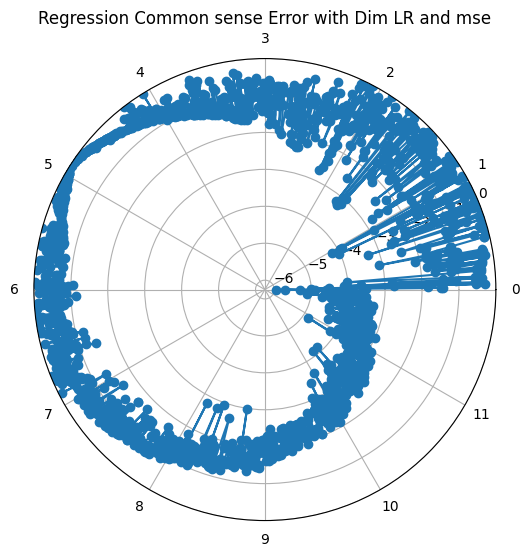

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title(f"Regression Common sense Error with Dim LR and {loss_function}")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [ ]:
min(history.history['val_loss'])

3.5491740703582764

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.33149540424346924

In [ ]:
history.history['mae'][min_val_loss_index]

0.42603132128715515

In [ ]:
history.history['val_mae'][min_val_loss_index]

1.4662344455718994

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 3.5491740703582764
Loss at this : 0.33149540424346924
MAE : 0.42603132128715515
MAE Val : 1.4662344455718994
Common Sense MAE Train : 1.3868202926834956
Common Sense MAE Val : 1.4655671723272539
Common Sense MAE Test : 1.3990428665150536


In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
# optimizer = keras.optimizers.Adam(learning_rate=1e-3,  weight_decay=1e-5)
optimizer = "adam"
loss_function = "mse"
metrics = ["mae"]

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(5, 5),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(3, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 150, 150, 32)   │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 50, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 50, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 50, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 50, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 25, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 25, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 25, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 25, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 12, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 12, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 12, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 12, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 6, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 6, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 13824)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │     7,078,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,534,465 (28.74 MB)

 Trainable params: 7,533,505 (28.74 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)

In [ ]:
history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 34.2426 - mae: 3.8368 - val_loss: 23.1388 - val_mae: 3.9153 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 11.7559 - mae: 2.7628 - val_loss: 19.3982 - val_mae: 3.6011 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 9.9631 - mae: 2.5274 - val_loss: 23.5075 - val_mae: 3.9854 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 8.9464 - mae: 2.3621 - val_loss: 20.3009 - val_mae: 3.7048 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 7.8042 - mae: 2.1771 - val_loss: 17.7356 - val_mae: 3.5016 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 6.8032 - mae: 2.0143 - val_loss: 20.0584 - val_mae: 3.6877 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 6.0433 - mae: 1.8531 - val_loss: 17.8394 - val_mae: 3.5218 - lear

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

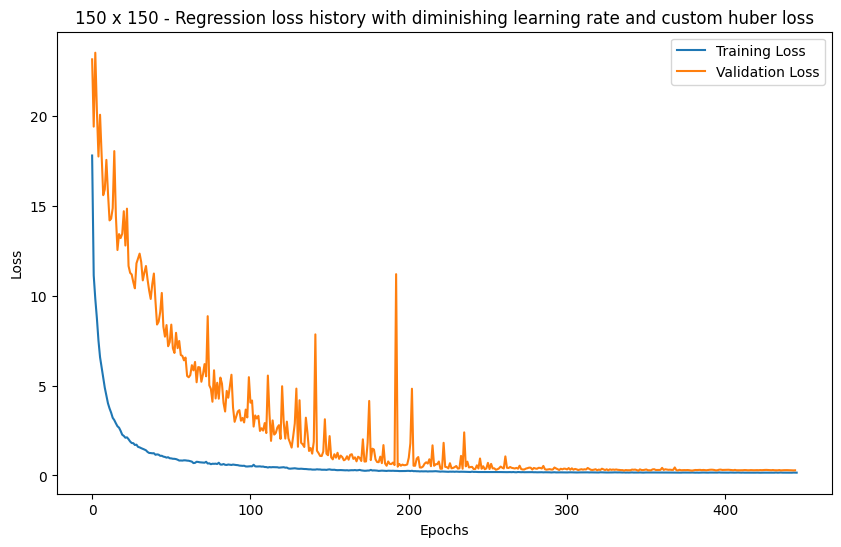

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.30760230633968777

Text(0.5, 1.0, 'Regression with diminishing learning rate with mse')

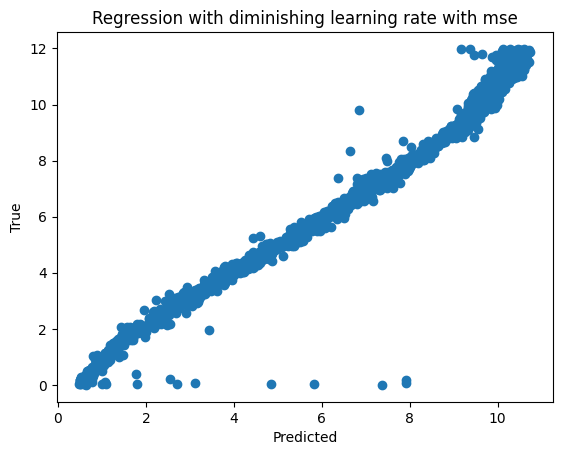

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'Regression with diminishing learning rate with {loss_function}')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

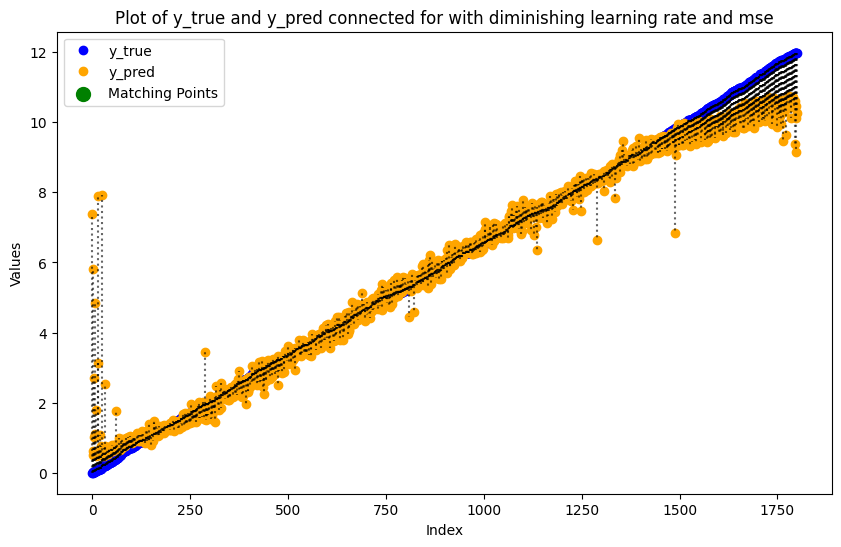

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title(f'Plot of y_true and y_pred connected for with diminishing learning rate and {loss_function}')
plt.legend()

# Show the plot
plt.show()

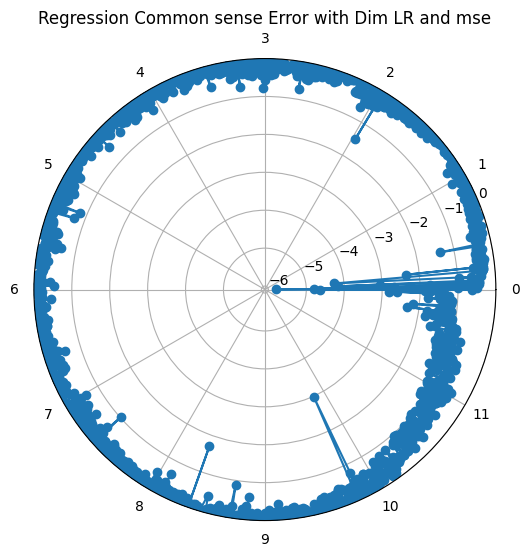

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title(f"Regression Common sense Error with Dim LR and {loss_function}")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [ ]:
min(history.history['val_loss'])

0.2638610601425171

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.1645340621471405

In [ ]:
history.history['mae'][min_val_loss_index]

0.3052096962928772

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.2987612783908844

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.2638610601425171
Loss at this : 0.1645340621471405
MAE : 0.3052096962928772
MAE Val : 0.2987612783908844
Common Sense MAE Train : 0.27078670338307487
Common Sense MAE Val : 0.29628030408753286
Common Sense MAE Test : 0.30760230633968777


Connected to .venv (Python 3.10.7)

In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

2024-11-07 15:17:27.833459: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-07 15:17:27.850335: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-07 15:17:27.872193: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-07 15:17:27.878842: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-07 15:17:27.895448: I tensorflow/core/platform/cpu_feature_guar

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
plt.show(images[0])

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
plt.show(images[0])

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

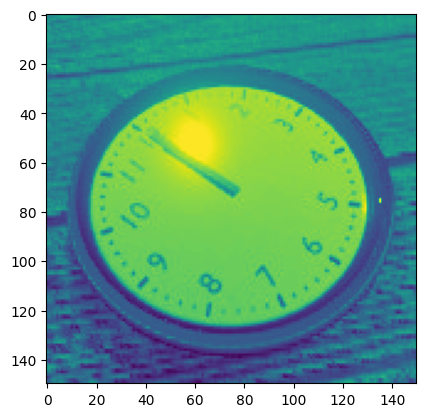

In [ ]:
plt.imshow(images[0])

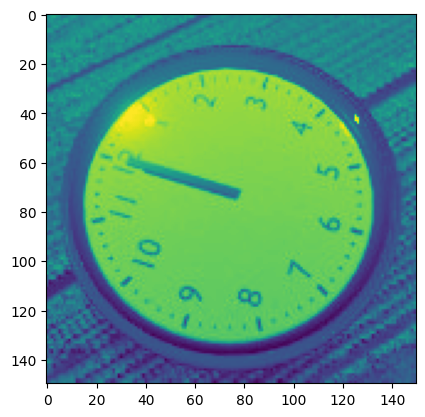

In [ ]:
plt.imshow(images[1])

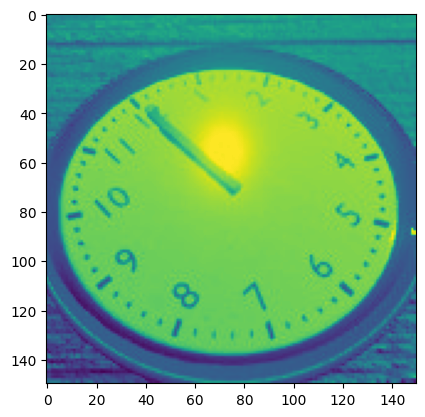

In [ ]:
plt.imshow(images[20])

In [ ]:
images = np.load("A1/data/images.npy")
labels = np.load("A1/data/labels.npy")

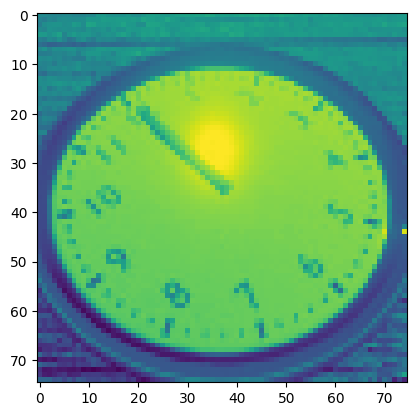

: 

In [ ]:
plt.imshow(images[20])

No kernel connected

In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images.npy")
labels = np.load("A1/data/labels.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 75, 75, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
# optimizer = keras.optimizers.Adam(learning_rate=1e-3,  weight_decay=1e-5)
optimizer = "adam"
loss_function = "mse"
metrics = ["mae"]

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(5, 5),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 75, 75, 32)     │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 18, 18, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 18, 18, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │     2,097,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,553,729 (9.74 MB)

 Trainable params: 2,552,769 (9.74 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=100,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)

In [ ]:
history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
223/225 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 20.3692 - mae: 3.5440

2024-11-08 18:10:35.251935: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_151', 8 bytes spill stores, 8 bytes spill loads



225/225 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 20.2949 - mae: 3.5382 - val_loss: 24.1985 - val_mae: 4.0026 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 11.3507 - mae: 2.7233 - val_loss: 21.7524 - val_mae: 3.8006 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 9.4819 - mae: 2.4356 - val_loss: 21.4121 - val_mae: 3.7395 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 8.1843 - mae: 2.2363 - val_loss: 16.5671 - val_mae: 3.2990 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 6.6516 - mae: 1.9800 - val_loss: 12.1876 - val_mae: 2.7950 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 5.4279 - mae: 1.7605 - val_loss: 12.6516 - val_mae: 2.9541 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 4.8453 - mae: 1.6574 - val_loss: 10.7965 - val_mae: 2.7021 - learning_rate: 0.0010


In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

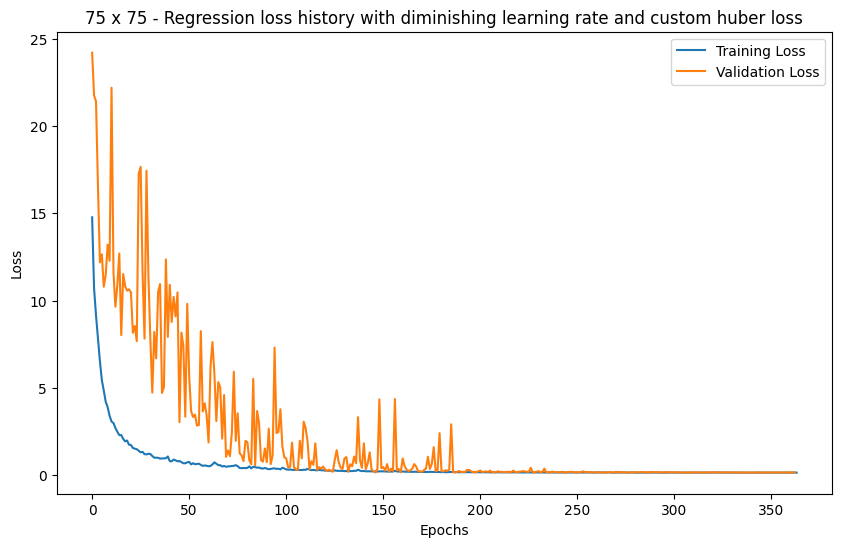

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.22943993670717877

Text(0.5, 1.0, 'Regression with diminishing learning rate with mse')

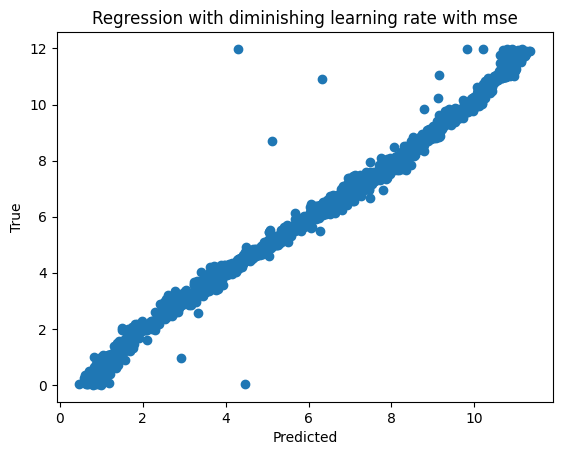

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'Regression with diminishing learning rate with {loss_function}')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

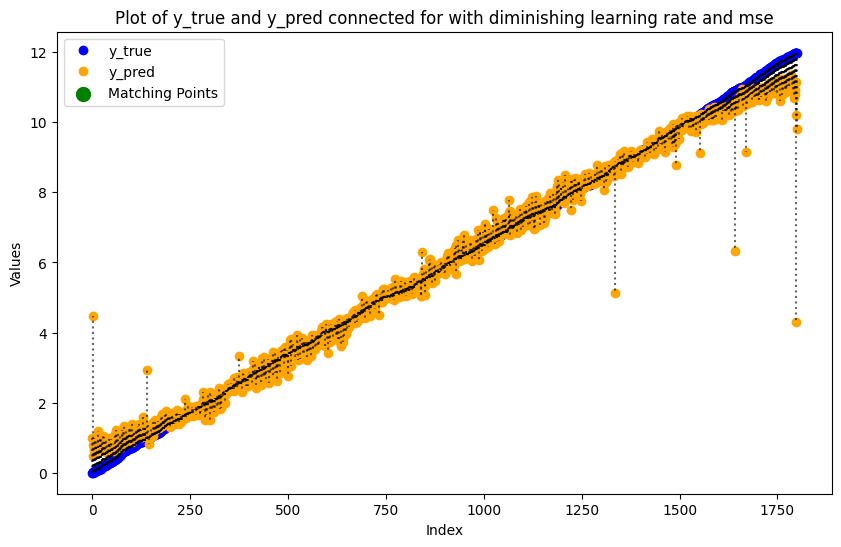

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title(f'Plot of y_true and y_pred connected for with diminishing learning rate and {loss_function}')
plt.legend()

# Show the plot
plt.show()

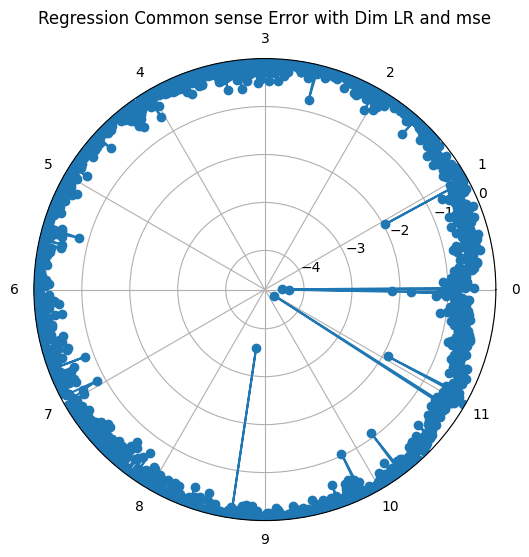

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title(f"Regression Common sense Error with Dim LR and {loss_function}")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [ ]:
min(history.history['val_loss'])

0.1442405879497528

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.15378114581108093

In [ ]:
history.history['mae'][min_val_loss_index]

0.2956909239292145

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.23074579238891602

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.1442405879497528
Loss at this : 0.15378114581108093
MAE : 0.2956909239292145
MAE Val : 0.23074579238891602
Common Sense MAE Train : 0.2018334032481776
Common Sense MAE Val : 0.22723943970362345
Common Sense MAE Test : 0.22943993670717877


In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images.npy")
labels = np.load("A1/data/labels.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 75, 75, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
optimizer = keras.optimizers.Adam(learning_rate=1e-3,  weight_decay=1e-5)
# optimizer = "adam"
loss_function = "huber"
metrics = ["mae"]

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(5, 5),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())
    
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)               │ (None, 75, 75, 32)     │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 18, 18, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 18, 18, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 4, 4, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 2, 2, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 2,687,361 (10.25 MB)

 Trainable params: 2,685,377 (10.24 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(5, 5),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())
    
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(256, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_13 (Conv2D)              │ (None, 75, 75, 32)     │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 18, 18, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 18, 18, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 4, 4, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 2, 2, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 2,785,921 (10.63 MB)

 Trainable params: 2,783,937 (10.62 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=50,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)

In [ ]:
history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500


2024-11-08 18:24:39.569972: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 764.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


220/225 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.9749 - mae: 3.4455

2024-11-08 18:24:52.872116: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_184', 8 bytes spill stores, 8 bytes spill loads



225/225 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step - loss: 2.9666 - mae: 3.4370 - val_loss: 3.5225 - val_mae: 3.9916 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 2.1876 - mae: 2.6451 - val_loss: 2.8507 - val_mae: 3.3258 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.8977 - mae: 2.3498 - val_loss: 1.9586 - val_mae: 2.4209 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.5096 - mae: 1.9460 - val_loss: 1.7856 - val_mae: 2.2420 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.2582 - mae: 1.6836 - val_loss: 1.8008 - val_mae: 2.2578 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.0286 - mae: 1.4398 - val_loss: 1.7460 - val_mae: 2.2018 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.9078 - mae: 1.3088 - val_loss: 1.9781 - val_mae: 2.4437 - learning_rate: 0.0010
Epoch 8/5

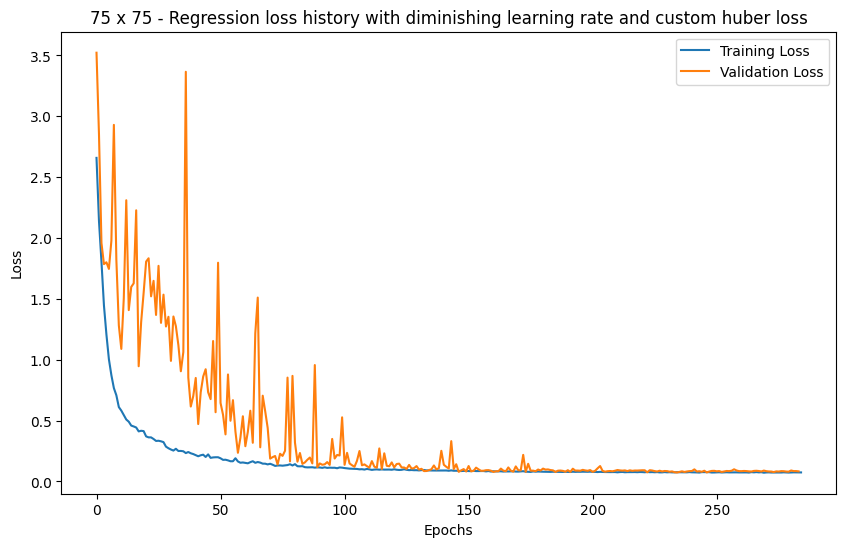

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.24203294427214728

Text(0.5, 1.0, 'Regression with diminishing learning rate with huber')

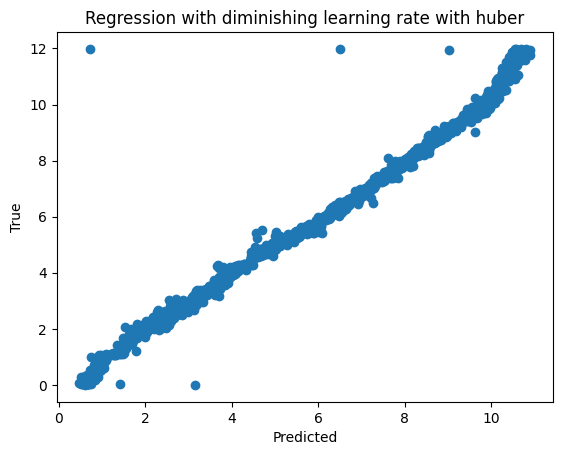

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'Regression with diminishing learning rate with {loss_function}')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

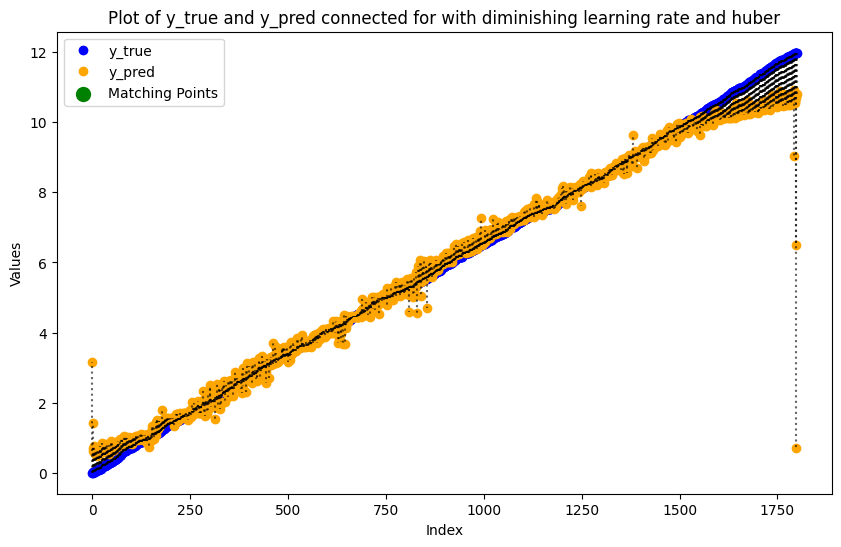

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title(f'Plot of y_true and y_pred connected for with diminishing learning rate and {loss_function}')
plt.legend()

# Show the plot
plt.show()

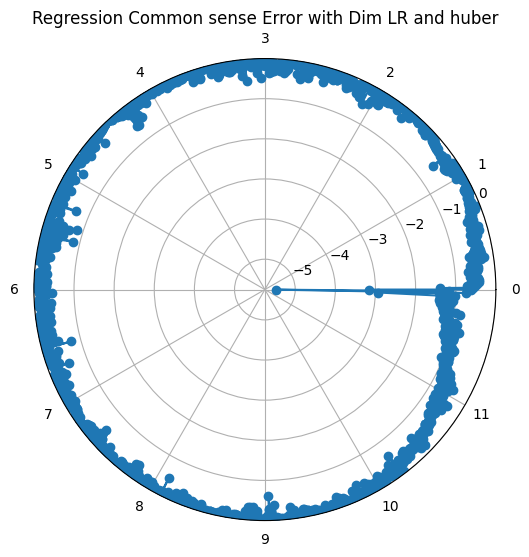

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title(f"Regression Common sense Error with Dim LR and {loss_function}")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

0.0730329379439354

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.07564906775951385

In [ ]:
history.history['mae'][min_val_loss_index]

0.2891188859939575

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.2491936981678009

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.0730329379439354
Loss at this : 0.07564906775951385
MAE : 0.2891188859939575
MAE Val : 0.2491936981678009
Common Sense MAE Train : 0.23319619746661188
Common Sense MAE Val : 0.24306065590137907
Common Sense MAE Test : 0.24203294427214728


Restarted .venv (Python 3.10.7)

In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
optimizer = keras.optimizers.Adam(learning_rate=1e-3,  weight_decay=1e-5)
# optimizer = "adam"
loss_function = "huber"
metrics = ["mae"]

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(5, 5),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(4, 4)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(4, 4)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())
    
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(256, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 150, 150, 32)   │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 9, 9, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 9, 9, 64)       │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 9, 9, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 4, 4, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 4, 4, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 2, 2, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 2, 2, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 1, 1, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 1, 1, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,999,489 (7.63 MB)

 Trainable params: 1,997,505 (7.62 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=50,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)

In [ ]:
history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500


I0000 00:00:1731110088.439854   14906 service.cc:146] XLA service 0x7f3414001130 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731110088.439960   14906 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1731110088.439972   14906 service.cc:154]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-11-08 18:54:48.604531: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-08 18:54:49.115167: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907


 15/225 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 4.1600 - mae: 4.6407

I0000 00:00:1731110096.467246   14906 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 2.7587 - mae: 3.2261

2024-11-08 18:55:05.113247: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_184', 8 bytes spill stores, 8 bytes spill loads



225/225 ━━━━━━━━━━━━━━━━━━━━ 23s 51ms/step - loss: 2.7572 - mae: 3.2245 - val_loss: 3.0666 - val_mae: 3.5389 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 2.0612 - mae: 2.5167 - val_loss: 3.2673 - val_mae: 3.7365 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 1.8541 - mae: 2.3013 - val_loss: 2.9992 - val_mae: 3.4711 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 1.5133 - mae: 1.9506 - val_loss: 2.0040 - val_mae: 2.4686 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 1.1816 - mae: 1.6014 - val_loss: 1.6844 - val_mae: 2.1267 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.0220 - mae: 1.4331 - val_loss: 1.5307 - val_mae: 1.9724 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.8984 - mae: 1.3011 - val_loss: 2.2992 - val_mae: 2.7652 - learning_rate: 0.0010
Epo

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

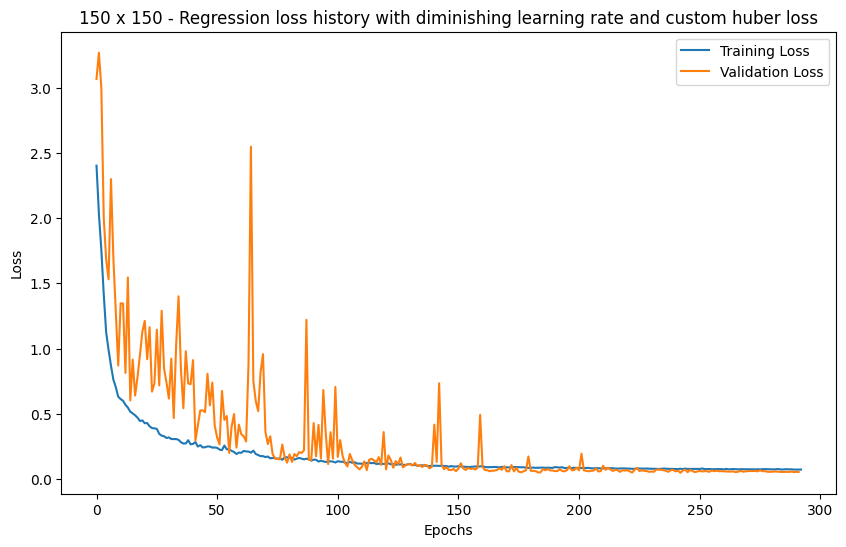

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.18424500140190123

Text(0.5, 1.0, 'Regression with diminishing learning rate with huber')

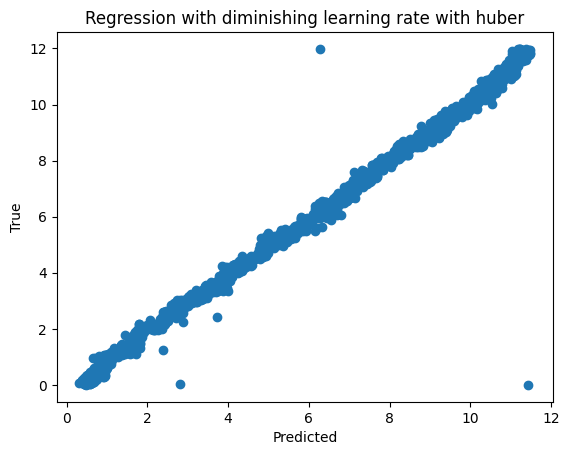

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'Regression with diminishing learning rate with {loss_function}')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

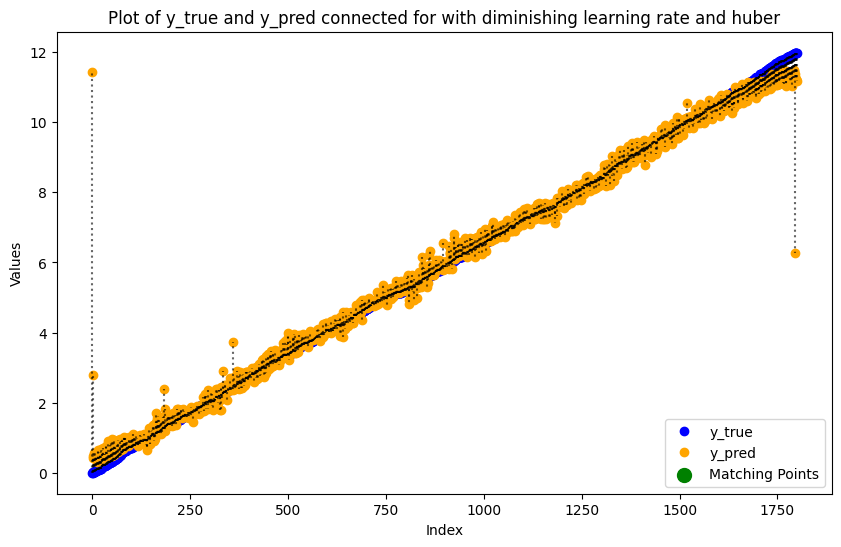

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title(f'Plot of y_true and y_pred connected for with diminishing learning rate and {loss_function}')
plt.legend()

# Show the plot
plt.show()

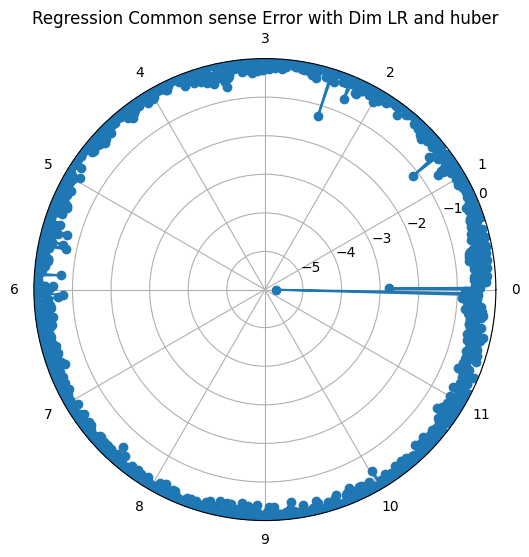

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title(f"Regression Common sense Error with Dim LR and {loss_function}")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [ ]:
min(history.history['val_loss'])

0.0484890341758728

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.07888853549957275

In [ ]:
history.history['mae'][min_val_loss_index]

0.30069002509117126

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.20110373198986053

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.0484890341758728
Loss at this : 0.07888853549957275
MAE : 0.30069002509117126
MAE Val : 0.20110373198986053
Common Sense MAE Train : 0.1670284010752307
Common Sense MAE Val : 0.18340098798603482
Common Sense MAE Test : 0.18424500140190123


In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_20 (Conv2D)              │ (None, 150, 150, 32)   │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_20          │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 37, 37, 32)     │        25,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 18, 18, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_21          │ (None, 18, 18, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 18, 18, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 4, 4, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_22          │ (None, 4, 4, 64)       │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 4, 4, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_23          │ (None, 2, 2, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 2, 2, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_24 (MaxPooling2D) │ (None, 1, 1, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 1, 1, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 711,969 (2.72 MB)

 Trainable params: 710,945 (2.71 MB)

 Non-trainable params: 1,024 (4.00 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=50,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)

In [ ]:
history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 2.7275 - mae: 3.1956 - val_loss: 2.7888 - val_mae: 3.2626 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 2.1071 - mae: 2.5658 - val_loss: 2.8828 - val_mae: 3.3563 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 1.7772 - mae: 2.2234 - val_loss: 2.8238 - val_mae: 3.2982 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 1.3833 - mae: 1.8133 - val_loss: 2.1889 - val_mae: 2.6519 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 1.1457 - mae: 1.5656 - val_loss: 1.1001 - val_mae: 1.5333 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.9374 - mae: 1.3432 - val_loss: 1.3170 - val_mae: 1.7607 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.7994 - mae: 1.1952 - val_loss: 2.2608 - val_mae: 2.7207 - learning_rate

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

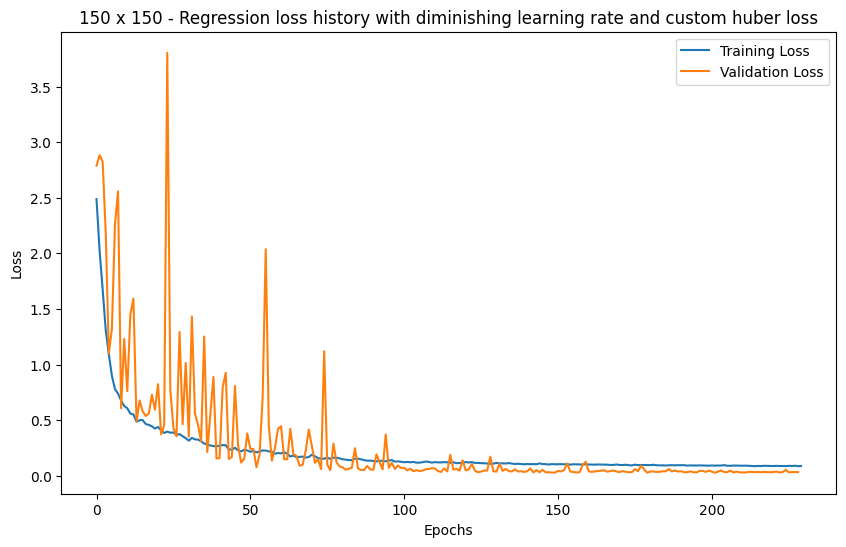

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.18528397089597914

Text(0.5, 1.0, 'Regression with diminishing learning rate with huber')

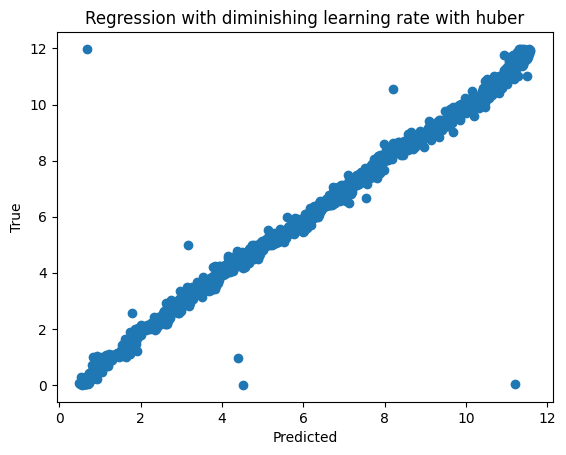

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'Regression with diminishing learning rate with {loss_function}')

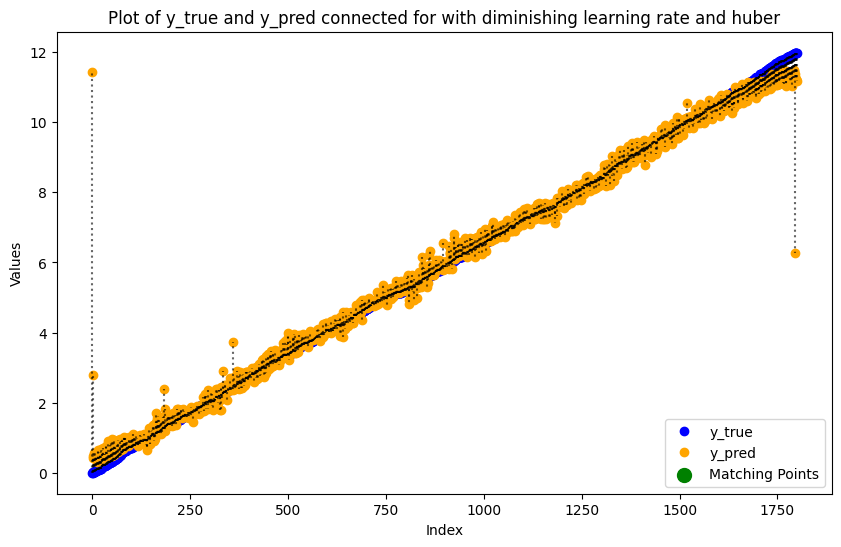

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title(f'Plot of y_true and y_pred connected for with diminishing learning rate and {loss_function}')
plt.legend()

# Show the plot
plt.show()

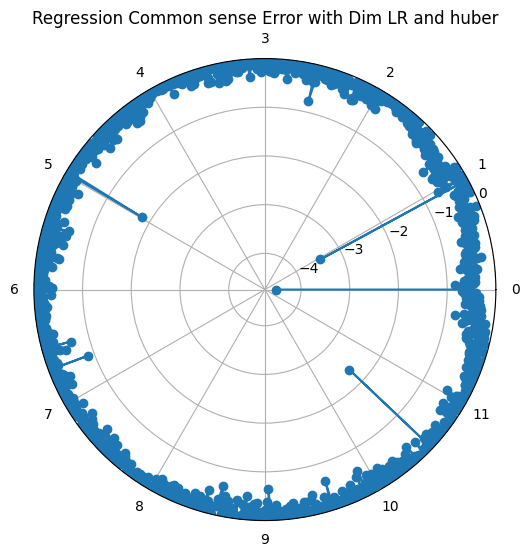

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title(f"Regression Common sense Error with Dim LR and {loss_function}")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
min(history.history['val_loss'])

0.026698989793658257

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.09508663415908813

In [ ]:
history.history['mae'][min_val_loss_index]

0.3314381539821625

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.1791176199913025

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.026698989793658257
Loss at this : 0.09508663415908813
MAE : 0.3314381539821625
MAE Val : 0.1791176199913025
Common Sense MAE Train : 0.16903919949285187
Common Sense MAE Val : 0.17912113939762117
Common Sense MAE Test : 0.18528397089597914


In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
optimizer = keras.optimizers.Adam(learning_rate=1e-3,  weight_decay=1e-5)
# optimizer = "adam"
loss_function = "huber"
metrics = ["mae"]

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(5, 5),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())
    
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(256, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

/local/s3777103/IDL-11/.venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_25 (Conv2D)              │ (None, 150, 150, 32)   │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_25 (MaxPooling2D) │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_32 (Dropout)            │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_26 (MaxPooling2D) │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_27 (Conv2D)              │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_27 (MaxPooling2D) │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_27          │ (None, 18, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_34 (Dropout)            │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_28          │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 9, 9, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_35 (Dropout)            │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_29          │ (None, 4, 4, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_36 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 5,931,649 (22.63 MB)

 Trainable params: 5,929,665 (22.62 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(5, 5),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(3, 3)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())
    
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(256, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_30 (Conv2D)              │ (None, 150, 150, 32)   │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_30 (MaxPooling2D) │ (None, 50, 50, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_30          │ (None, 50, 50, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 50, 50, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_39 (Dropout)            │ (None, 50, 50, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_31 (MaxPooling2D) │ (None, 25, 25, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_31          │ (None, 25, 25, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_32 (Conv2D)              │ (None, 25, 25, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_40 (Dropout)            │ (None, 25, 25, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_32 (MaxPooling2D) │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_32          │ (None, 12, 12, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_33 (Conv2D)              │ (None, 12, 12, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_41 (Dropout)            │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_33 (MaxPooling2D) │ (None, 6, 6, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_33          │ (None, 6, 6, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_34 (Conv2D)              │ (None, 6, 6, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_42 (Dropout)            │ (None, 6, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_34 (MaxPooling2D) │ (None, 3, 3, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_34          │ (None, 3, 3, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 512)            │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_43 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 4,096,641 (15.63 MB)

 Trainable params: 4,094,657 (15.62 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [ ]:
2

2

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(5, 5),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(5, 5)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(3, 3)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())
    
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(256, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_35 (Conv2D)              │ (None, 150, 150, 32)   │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_35 (MaxPooling2D) │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_35          │ (None, 30, 30, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_36 (Conv2D)              │ (None, 30, 30, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_46 (Dropout)            │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_36 (MaxPooling2D) │ (None, 10, 10, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_36          │ (None, 10, 10, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_37 (Conv2D)              │ (None, 10, 10, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_47 (Dropout)            │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_37 (MaxPooling2D) │ (None, 5, 5, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_37          │ (None, 5, 5, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_38 (Conv2D)              │ (None, 5, 5, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_48 (Dropout)            │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_38 (MaxPooling2D) │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_38          │ (None, 2, 2, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_39 (Conv2D)              │ (None, 2, 2, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_49 (Dropout)            │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_39 (MaxPooling2D) │ (None, 1, 1, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_39          │ (None, 1, 1, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_50 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,999,489 (7.63 MB)

 Trainable params: 1,997,505 (7.62 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(5, 5),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(5, 5)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(3, 3)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())
    
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(256, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    
    model.add(keras.layers.Dense(64, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    
    model.add(keras.layers.Dense(32, activation='relu'))
    model.add(keras.layers.Dropout(0.1))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_40 (Conv2D)              │ (None, 150, 150, 32)   │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_40 (MaxPooling2D) │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_40          │ (None, 30, 30, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_41 (Conv2D)              │ (None, 30, 30, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_53 (Dropout)            │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_41 (MaxPooling2D) │ (None, 10, 10, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_41          │ (None, 10, 10, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_42 (Conv2D)              │ (None, 10, 10, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_54 (Dropout)            │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_42 (MaxPooling2D) │ (None, 5, 5, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_42          │ (None, 5, 5, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (None, 5, 5, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_55 (Dropout)            │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_43 (MaxPooling2D) │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_43          │ (None, 2, 2, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 2, 2, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_56 (Dropout)            │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_44 (MaxPooling2D) │ (None, 1, 1, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_44          │ (None, 1, 1, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_8 (Flatten)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_57 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 2,009,729 (7.67 MB)

 Trainable params: 2,007,745 (7.66 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [ ]:
import numpy as np
import keras_tuner as kt
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
images = np.load("A1/data/images_150.npy")
labels = np.load("A1/data/labels_150.npy")

In [ ]:
# function to map (hour, minute) tuples to float values upto 12
def time_to_regression(row):
    return round((row[0] + row[1]/60.0), 4)

img_rows = images.shape[1]
img_cols = images.shape[2]

new_labels = np.apply_along_axis(time_to_regression, axis=1, arr=labels)

In [ ]:
images = images.astype('float32')/255.0

x_train, x_test, y_train, y_test = train_test_split(images, new_labels, test_size=0.20, random_state=42) 
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.50, random_state=33) 

In [ ]:
batch_size = 64
epochs = 500

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print(x_val.shape)

(1800, 150, 150, 1)


In [ ]:
# Custom loss function for common sense difference
def reg_loss_funtion(y_true, y_pred):
    # Calculate the absolute error
    abs_diff = tf.abs(y_true - y_pred)
    
    min_error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))

    # Return the mean squared of the minimum error
    return tf.reduce_mean(tf.square(min_error))

def reg_custom_mae(y_true, y_pred):
    abs_diff = tf.abs(y_true - y_pred)
    wrapped_diff = tf.abs(12. - abs_diff)
    common_sense_error = tf.minimum(abs_diff, wrapped_diff)
    return tf.reduce_mean(common_sense_error, axis=0)


def custom_huber_loss(y_true, y_pred, delta=1.0):
    abs_diff = tf.abs(y_true - y_pred)
    error = tf.where((y_pred >= 0.) & (y_pred < 12.), tf.minimum(abs_diff, 12. - abs_diff), tf.abs(y_pred - y_true))
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.reduce_mean(tf.where(is_small_error, small_error_loss, large_error_loss))

In [ ]:
optimizer = keras.optimizers.Adam(learning_rate=1e-3,  weight_decay=1e-5)
# optimizer = "adam"
loss_function = "huber"
metrics = ["mae"]

In [ ]:
def build_model(input_shape):
    model = keras.models.Sequential()
    
    model.add(keras.layers.Conv2D(32, kernel_size=(5, 5),
                    activation='relu', padding='same',
                    input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D(pool_size=(5, 5)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.2))
    model.add(keras.layers.MaxPooling2D(pool_size=(3, 3)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())

    model.add(keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(keras.layers.BatchNormalization())
    
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(512, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(256, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.Dense(128, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    
    model.add(keras.layers.Dense(64, activation='relu'))
    model.add(keras.layers.Dropout(0.3))
    
    model.add(keras.layers.Dense(32, activation='relu'))
    model.add(keras.layers.Dropout(0.1))

    model.add(keras.layers.Dense(1, activation='linear'))
    
    # model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3, 
    #                                               weight_decay=1e-5), 
    #               loss='huber', metrics=['mae'])
    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    return model

In [ ]:
model = build_model(input_shape=input_shape)
model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_45 (Conv2D)              │ (None, 150, 150, 32)   │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_45 (MaxPooling2D) │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_45          │ (None, 30, 30, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_46 (Conv2D)              │ (None, 30, 30, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_62 (Dropout)            │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_46 (MaxPooling2D) │ (None, 10, 10, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_46          │ (None, 10, 10, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_47 (Conv2D)              │ (None, 10, 10, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_63 (Dropout)            │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_47 (MaxPooling2D) │ (None, 5, 5, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_47          │ (None, 5, 5, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_48 (Conv2D)              │ (None, 5, 5, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_64 (Dropout)            │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_48 (MaxPooling2D) │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_48          │ (None, 2, 2, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_49 (Conv2D)              │ (None, 2, 2, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_65 (Dropout)            │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_49 (MaxPooling2D) │ (None, 1, 1, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_49          │ (None, 1, 1, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_66 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 2,009,729 (7.67 MB)

 Trainable params: 2,007,745 (7.66 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [ ]:
# Initialize EarlyStopping with patience
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # metric to monitor
    patience=50,          # number of epochs to wait for improvement
    restore_best_weights=True  # restore the best weights after stopping
)
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.8, patience=10, min_lr=1e-6
)

In [ ]:
history = model.fit(x_train, y_train,
                batch_size=batch_size,
                epochs=epochs,
                verbose=1,
                validation_data=(x_val, y_val),
                callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - loss: 2.8792 - mae: 3.3500 - val_loss: 3.0617 - val_mae: 3.5344 - learning_rate: 0.0010
Epoch 2/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 2.2108 - mae: 2.6675 - val_loss: 3.0085 - val_mae: 3.4826 - learning_rate: 0.0010
Epoch 3/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 2.0082 - mae: 2.4592 - val_loss: 3.1221 - val_mae: 3.5935 - learning_rate: 0.0010
Epoch 4/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.6404 - mae: 2.0819 - val_loss: 2.6579 - val_mae: 3.1276 - learning_rate: 0.0010
Epoch 5/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 1.3273 - mae: 1.7536 - val_loss: 2.1287 - val_mae: 2.5935 - learning_rate: 0.0010
Epoch 6/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 1.1028 - mae: 1.5190 - val_loss: 2.3270 - val_mae: 2.7877 - learning_rate: 0.0010
Epoch 7/500
225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.9715 - mae: 1.3774 - val_loss: 2.1531 - val_mae: 2.6209 - learning_rate

In [ ]:
# model.save_weights('75_regression_without_rlrop.weights.h5')

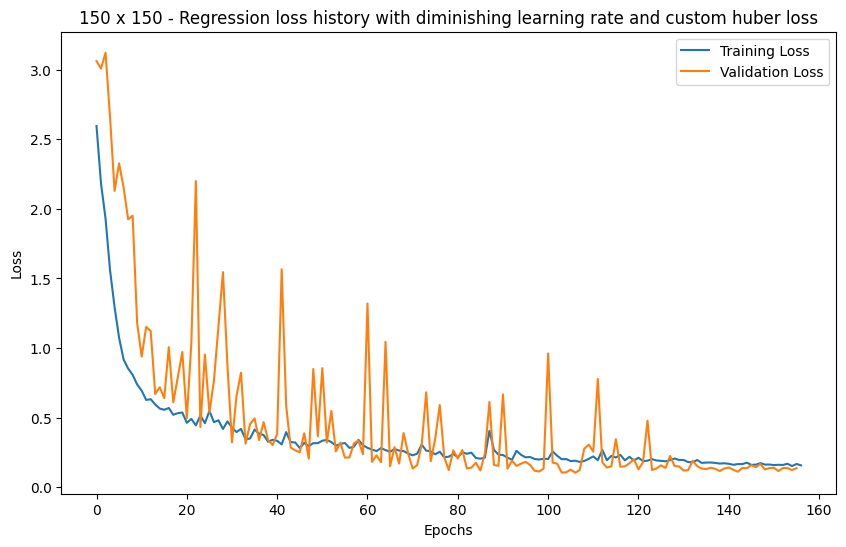

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss[:-1], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title(f'{img_rows} x {img_cols} - Regression loss history with diminishing learning rate and custom huber loss')
plt.legend()
plt.show()
plt.close()

In [ ]:
y_test_pred = model.predict(x_test).flatten()

57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step


In [ ]:
abs_values = abs(y_test_pred.flatten()-y_test)
# common_sense_error = np.minimum(12-abs_values, abs_values)
common_sense_error = np.where((y_test_pred.flatten() >= 0.) & (y_test_pred.flatten() < 12.), np.minimum(abs_values, 12. - abs_values), np.minimum(np.abs(y_test_pred.flatten() - y_test), np.abs(y_test_pred.flatten() - (12. - y_test))))

score = np.mean(common_sense_error)
score

0.3312701963420444

Text(0.5, 1.0, 'Regression with diminishing learning rate with huber')

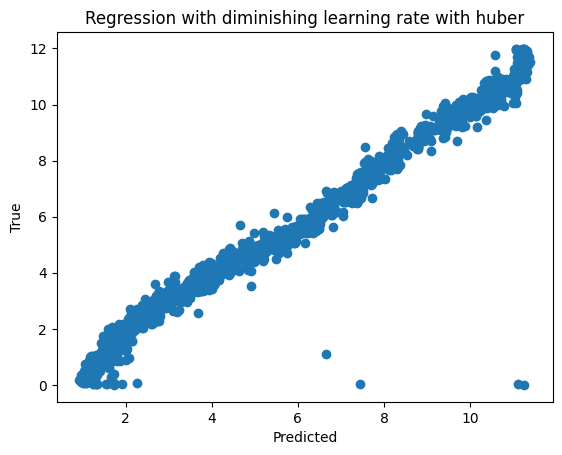

In [ ]:
plt.scatter(y_test_pred, y_test)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'Regression with diminishing learning rate with {loss_function}')

In [ ]:
sorted_indices = np.argsort(y_test)
sorted_y_test = y_test[sorted_indices]
sorted_y_pred = y_test_pred[sorted_indices]

same_indices = np.where(sorted_y_test == sorted_y_pred)[0]

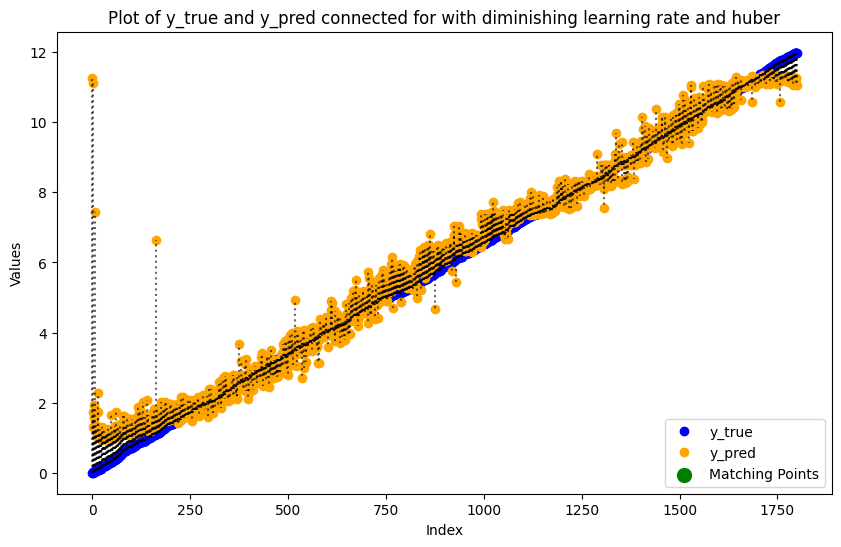

In [ ]:
# Plot y_true and y_pred
plt.figure(figsize=(10, 6))
plt.plot(sorted_y_test, label='y_true', marker='o', color='blue', linestyle='None')
plt.plot(sorted_y_pred, label='y_pred', marker='o', color='orange', linestyle='None')

# Highlight points where y_true and y_pred are the same
plt.scatter(same_indices, sorted_y_test[same_indices], color='green', s=100, label='Matching Points')

# Draw dotted lines between y_true and y_pred points at each index
for i in range(len(sorted_y_test)):
    plt.plot([i, i], [sorted_y_test[i], sorted_y_pred[i]], 'k:', alpha=0.6)  # 'k:' makes a black dotted line

plt.xlabel('Index')
plt.ylabel('Values')
plt.title(f'Plot of y_true and y_pred connected for with diminishing learning rate and {loss_function}')
plt.legend()

# Show the plot
plt.show()

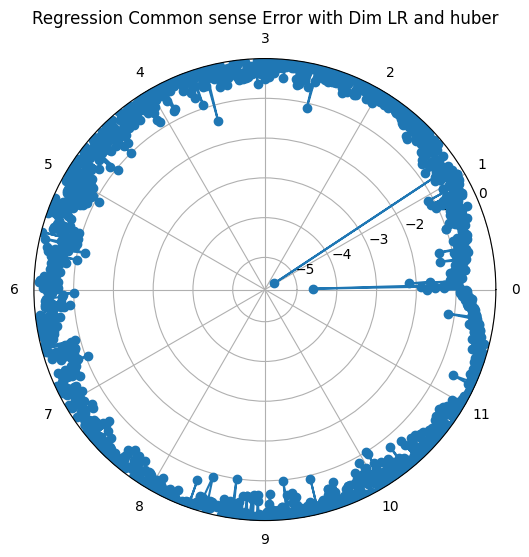

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

values = -common_sense_error[sorted_indices]  # Random values for each angle

# Create polar plot
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.plot(2 * np.pi * sorted_y_test/12, values, marker='o')

# Add title and show plot
ax.set_title(f"Regression Common sense Error with Dim LR and {loss_function}")
theta_ticks = np.linspace(0, 2 * np.pi, 12, endpoint=False)  # 12 hours around the clock
ax.set_xticks(theta_ticks)

ax.set_xticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'])

plt.show()

In [ ]:
y_train_pred = model.predict(x_train.reshape(x_train.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_train_pred.flatten()-y_train)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_train = np.mean(common_sense_error)

450/450 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step


In [ ]:
y_val_pred = model.predict(x_val.reshape(x_val.shape[0], img_rows, img_cols)).flatten()
abs_values = abs(y_val_pred.flatten()-y_val)
common_sense_error = np.minimum(abs_values, 12. - abs_values)
cse_val = np.mean(common_sense_error)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [ ]:
min(history.history['val_loss'])

0.1033681258559227

In [ ]:
min_val_loss_index = history.history['val_loss'].index(min(history.history['val_loss']))
history.history['loss'][min_val_loss_index]

0.1895756721496582

In [ ]:
history.history['mae'][min_val_loss_index]

0.47865229845046997

In [ ]:
history.history['val_mae'][min_val_loss_index]

0.3498876690864563

In [ ]:
print(f"Min Val loss : {min(history.history['val_loss'])}")
print(f"Loss at this : {history.history['loss'][min_val_loss_index]}")
print(f"MAE : {history.history['mae'][min_val_loss_index]}")
print(f"MAE Val : {history.history['val_mae'][min_val_loss_index]}")
print(f"Common Sense MAE Train : {cse_train}")
print(f"Common Sense MAE Val : {cse_val}")
print(f"Common Sense MAE Test : {score}")

Min Val loss : 0.1033681258559227
Loss at this : 0.1895756721496582
MAE : 0.47865229845046997
MAE Val : 0.3498876690864563
Common Sense MAE Train : 0.32108131019086306
Common Sense MAE Val : 0.3456469858004252
Common Sense MAE Test : 0.3312701963420444


: 

: 